# Check the standardized spectra
- This  just a little bit of example code to get you started

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import os
import sys
import pickle
from astropy.io import fits
import pandas as pd

%matplotlib nbagg

# ----------------- Import the other files of functions
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
from asap_lib.config import dataDir
from asap_lib.constants import elem_dict
import asap_lib.handleSpectra as sa


## Check Radial Velocities

**Print radial velocities**

In [17]:
def printRVinfo(name):
    rv = (open( dataDir+'/standardize_OPERA/Measured_RVs/'+name+'.txt' ).readlines())
    l1 = list(rv[0].split()[3:])
    l2 = list(rv[1].split()[3:])

    print('Radial Velocity {:.3f}'.format(float(rv[1].split()[1])) + ' +/- ' + '{:3f} km/s'.format(float(rv[1].split()[2])  ))
    print('\t - Used: '+ str([ (l1[i],round(float(l2[i]),3)) for i in range(len(l1))  ]))
    

In [18]:
for item in os.listdir(dataDir+'standardize_OPERA/Measured_RVs'):
    if item[-3:]  == 'txt':
        name = item.strip('.txt')
        print(name)
        printRVinfo( name )
        print('\n')

P198.0805+08.9428
Radial Velocity 104.428 +/- 0.562156 km/s
	 - Used: [('Ha', -103.6), ('Hb', -104.244), ('Mg', -105.062), ('Na', -104.806)]


P032.5309+29.6142
Radial Velocity -79.178 +/- 1.133438 km/s
	 - Used: [('Ha', 78.539), ('Hb', 80.771), ('Mg', 78.225)]


P323.0941+25.9363
Radial Velocity -400.343 +/- 0.077418 km/s
	 - Used: [('Ha', 400.42), ('Hb', 400.266)]


P002.2778+32.2590
Radial Velocity -104.835 +/- 2.073757 km/s
	 - Used: [('Ha', 106.581), ('Hb', 106.004), ('Mg', 101.921)]


P012.4948+34.7147
Radial Velocity -150.113 +/- 0.937962 km/s
	 - Used: [('Ha', 149.584), ('Hb', 151.431), ('Mg', 149.324)]


P022.9356+33.6946
Radial Velocity -69.530 +/- 0.825623 km/s
	 - Used: [('Ha', 69.183), ('Hb', 70.668), ('Mg', 68.737)]


P180.3205+02.5788
Radial Velocity -206.130 +/- 0.470579 km/s
	 - Used: [('Ha', 205.599), ('Hb', 206.876), ('Mg', 206.13), ('Na', 205.913)]


P112.5739+33.1071
Radial Velocity 77.660 +/- 2.109483 km/s
	 - Used: [('Ha', -76.666), ('Hb', -75.72), ('Mg', -80.592

**Save radial velocities and errors as a csv**

In [19]:
def getRVinfo(name):
    item = (open( dataDir+'/standardize_OPERA/Measured_RVs/'+name+'.txt' ).readlines())
    rv = float(item[1].split()[1])
    rverr = float(item[1].split()[2]) 
    return rv, rverr

In [20]:
names = []
rvs = []
rverrs = []

for item in os.listdir(dataDir+'standardize_OPERA/Measured_RVs'):
    if item[-3:]  == 'txt':
        name =   item.strip('.txt')      
        names.append(name )
        rv, rverr = getRVinfo( name )
        rvs.append( rv )
        rverrs.append(rverr )
        
df = pd.DataFrame( [names,rvs,rverrs] ).T
df.columns = ["Name", "RV", "RV_err"]

# df.to_csv( dataDir+'/RVTable.csv' )

## Compare a Feature

In [21]:
def compareFeature(specdict, feature,offset=1,plt_guidelines=False,plotRef=False,rv_template='HD122563.fits'):
    
    spectra = fits.open( os.path.join(os.getcwd(), 'asap_lib/data/rv_templates/'+rv_template)  )
    hdr = spectra[0].header
    naxis1 = hdr['NAXIS1']
    crval1 = hdr['CRVAL1']
    crpix1 = hdr['CRPIX1']
    cdelt1 = hdr['CDELT1']

    ref_wave = np.linspace(crval1, crval1 + (naxis1 * cdelt1), naxis1)
    ref_flux = spectra[0].data
    ref_name = 'HD122563.fits'
    
    if np.max(ref_wave) < 3000.:
        ref_wave = 10. * ref_wave
    
    fig = plt.figure(figsize=(10,8))
    ax = plt.subplot(111)
    
    plt.title('Comparing Feature: '+feature)
    plt.xlabel('Wavelength [$\AA$]')
    plt.ylabel('Flux + Offset')


    offset_num = 0
    text_place = 1 + 0.2
    for star in specdict.keys():
                
        #------------- Read Spectra
        with open(specdict[star], 'r') as f:
            lines = f.readlines()
            
        wave = []
        flux = []
        for i, l in enumerate(lines):
            if '#' not in l:
                split = l.split()
                wave.append(float(split[0]))
                flux.append(float(split[1]))

        wave = np.array(wave)
        flux = np.array(flux)
        
        good = np.where((wave >= features[feature]['min']) & (wave <= features[feature]['max']))[0]
        wave = wave[good]
        flux = flux[good] + offset_num

        #-------------   Plot      
        plt.plot(wave,flux,color='black',linewidth=linewidth,label='Object Spectrum')        
        plt.text(features[feature]['min'],text_place,star)
        
        if plotRef:
            good = np.where((ref_wave >= features[feature]['min']) & (ref_wave <= features[feature]['max']))[0]
            plt.plot(ref_wave[good],ref_flux[good]+offset_num,color='tab:orange',linewidth=linewidth,alpha=0.75)
        
        #-------------
        offset_num = offset_num + offset
        text_place = text_place + offset
        
    #------------- Guidelines
    ymin, ymax = ax.get_ylim()
    if plt_guidelines == True:
        for i in range(len(guidelines[feature])):
            plt.vlines(guidelines[feature][i], ymin,ymax,alpha=0.25,zorder=0)
    
    return ax

In [3]:
features = {'Hb':{'min':4830,'max':4890}, 
           'Mg':{'min':5160,'max':5190},
           'Na':{'min':5880,'max':5910},
           'Ha':{'min':6540,'max':6590},
           'Ca':{'min':8450,'max':8700} }


guidelines = {'Hb':[4861.320],
              'Mg':[5167.322,5172.685,5183.604],
              'Na':[5895.923,5889.950],
              'Ha':[6562.80],
              'Ca':[8498.02,8542.09,8662.14] }

linewidth = 1

In [4]:
specdict = {}
for item in os.listdir(  dataDir+'/final_spectra' ):
    if item[-2:] == 'xy':
        specdict[ item.strip('.xy') ] =  dataDir+'final_spectra/'+item

<IPython.core.display.Javascript object>


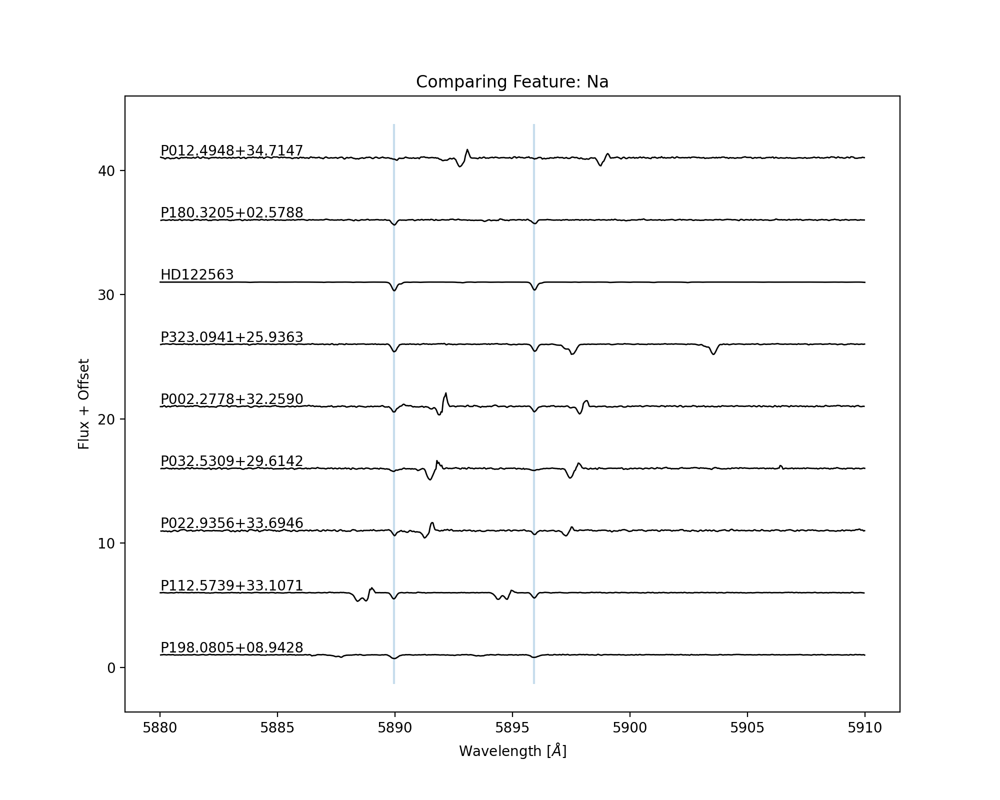

<AxesSubplot:title={'center':'Comparing Feature: Na'}, xlabel='Wavelength [$\\AA$]', ylabel='Flux + Offset'>

In [28]:
 compareFeature(specdict,'Na',offset=5,plt_guidelines=True, plotRef=False,)

## Check the lines 

Make and save a plot for every line in the given line list 

In [5]:
%matplotlib inline

In [17]:
def plotLines( specpath, linelist, save, window=5, plt_guidelines=True, plotRef = False, ftype='xy'):
    
    #-------------
    rv_template='HD122563.fits'
    spectra = fits.open( os.path.join(os.getcwd(), 'asap_lib/data/rv_templates/'+rv_template)  )
    hdr = spectra[0].header
    naxis1 = hdr['NAXIS1']
    crval1 = hdr['CRVAL1']
    crpix1 = hdr['CRPIX1']
    cdelt1 = hdr['CDELT1']

    ref_wave = np.linspace(crval1, crval1 + (naxis1 * cdelt1), naxis1)
    ref_flux = spectra[0].data
    ref_name = 'HD122563.fits'
    
    if np.max(ref_wave) < 3000.:
        ref_wave = 10. * ref_wave
  

    #------------- Read Spectra
#     with open(specpath, 'r') as f:
#         lines = f.readlines()

#     wave = []
#     flux = []
#     for i, l in enumerate(lines):
#         if '#' not in l:
#             split = l.split()
#             wave.append(float(split[0]))
#             flux.append(float(split[1]))

#     wave = np.array(wave)
#     flux = np.array(flux)
   
    wave, flux, err = sa.read_spec(spath, ftype=ftype)
    
    #-------------
    w = [ float(line.split()[0]) for line in open(linelist).readlines()[1:]]
    num = [ float(line.split()[1]) for line in open(linelist).readlines()[1:]]

    for i,line in enumerate(w):
        
        ind = np.where( (wave >= line-window) & (wave <= line+window) )
        
        swave = wave[ind]
        sflux = flux[ind]
        
        plt.figure(figsize=(10,4))
        ax = plt.subplot(111)
        
        title = '{} ( {} )'.format(num[i], elem_dict[ float(num[i]) ])
        plt.title(title)
        plt.xlabel('Wavelength '+r'$[\AA]$')
        plt.ylabel('Normalized Flux')
        
        plt.plot( swave, sflux ,  c='k', linewidth=1.5 , zorder=5, label='Object')
        
        if plotRef:
            good = np.where( (ref_wave >= line-window) & (ref_wave <= line+window) )
            plt.plot(ref_wave[good],ref_flux[good],color='tab:orange',linewidth=0.5,alpha=0.75, zorder=1, label='Reference (HD122563)')
    
        
        plt.grid(alpha=0.25)
    
        plt.legend(loc='lower right')
        #------------- Guidelines
        ymin, ymax = ax.get_ylim()
        if plt_guidelines == True:
                plt.vlines(line, ymin,ymax,alpha=0.25,zorder=0)


        plt.savefig( savePath+'/'+str(line)+'_'+str(num[i]).replace('.', '')+str(elem_dict[ float(num[i]) ]).replace(' ','')+'.png' , dpi=200 )
        plt.close()

In [18]:
# linelist = 'asap_lib/data/linelists/isolated_fe_lists/linelist_best_Fe.txt'
linelist = 'asap_lib/data/linelists/isolated_other_lists/linelist_noFe_xm.txt'

In [9]:
for item in list(specdict.keys()):
    if item[0] == 'P':
        
        savePath = os.path.join(dataDir, 'final_spectra_quickLook', item)
        exists = os.path.isdir(savePath)
        if not exists:
            os.mkdir(savePath)
            
        specPath = specdict[item]
        plotLines(specPath, linelist, savePath, window=5, plt_guidelines=True, plotRef = True)

In [14]:
spath = '../Data/HD122563-ESO/HD122563_ESO_3768_6639.bin'

In [15]:
w, f, e = sa.read_spec(spath, ftype='bin')

In [22]:
item = 'HD122563_ESO_3768_6639'

savePath = os.path.join(dataDir, 'final_spectra_quickLook', item)
exists = os.path.isdir(savePath)
if not exists:
    os.mkdir(savePath)

<IPython.core.display.Javascript object>


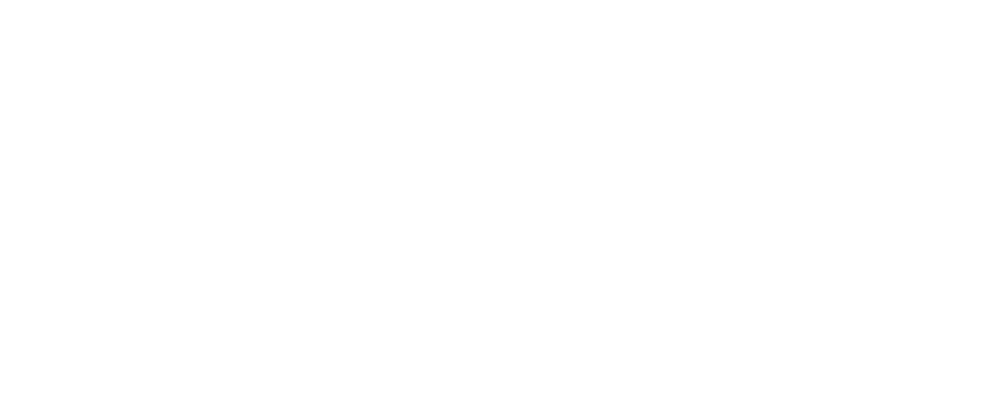

<IPython.core.display.Javascript object>


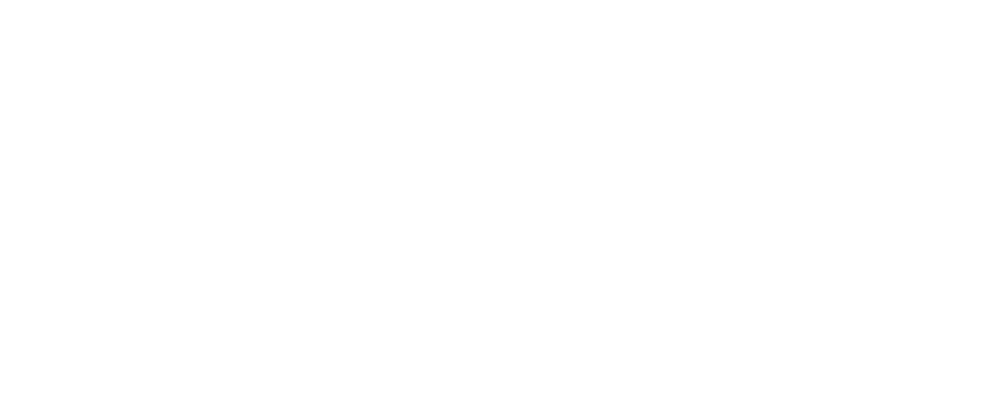

<IPython.core.display.Javascript object>


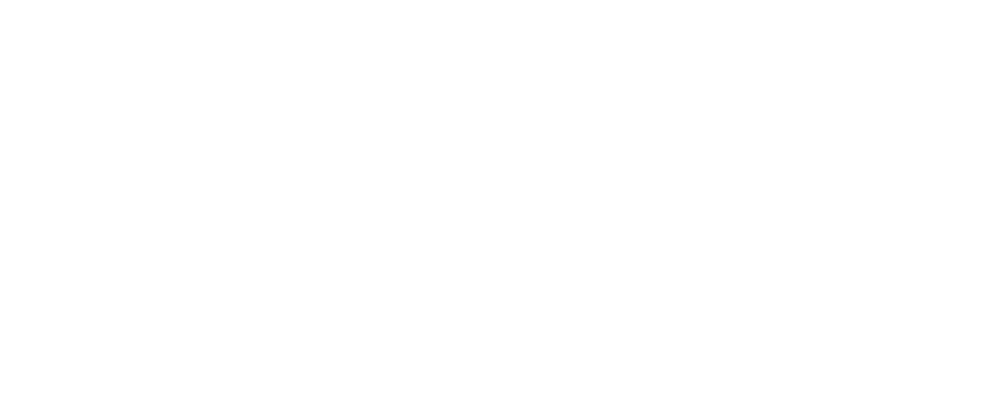

<IPython.core.display.Javascript object>


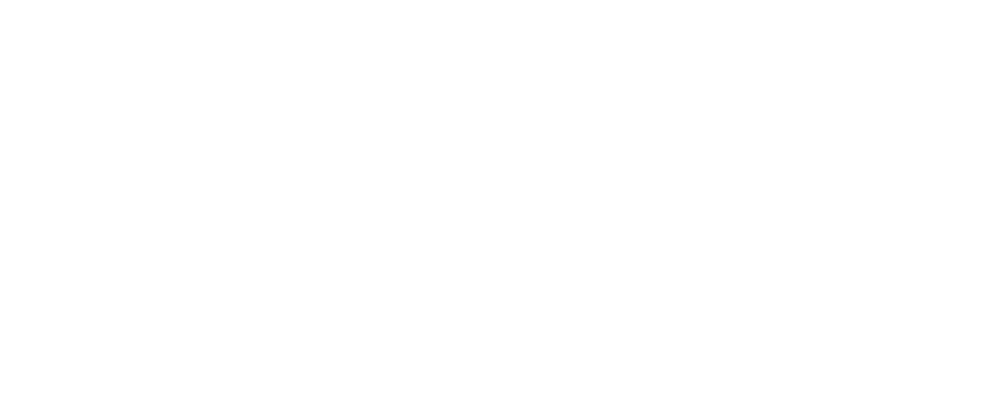

<IPython.core.display.Javascript object>


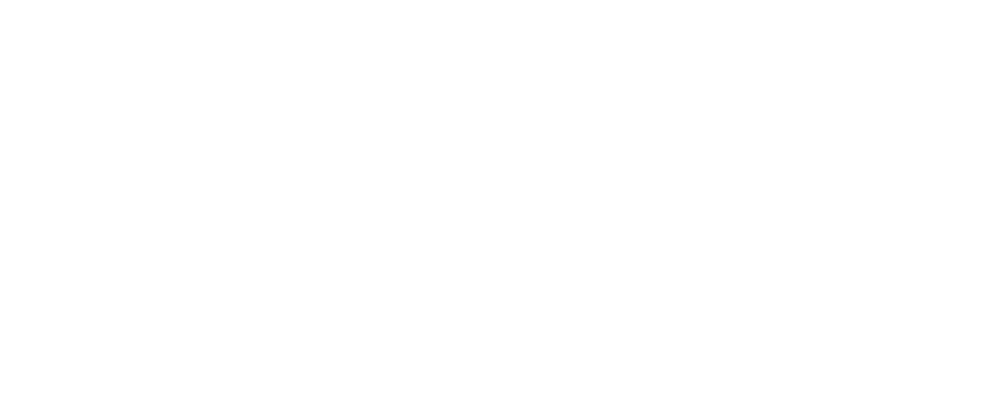

<IPython.core.display.Javascript object>


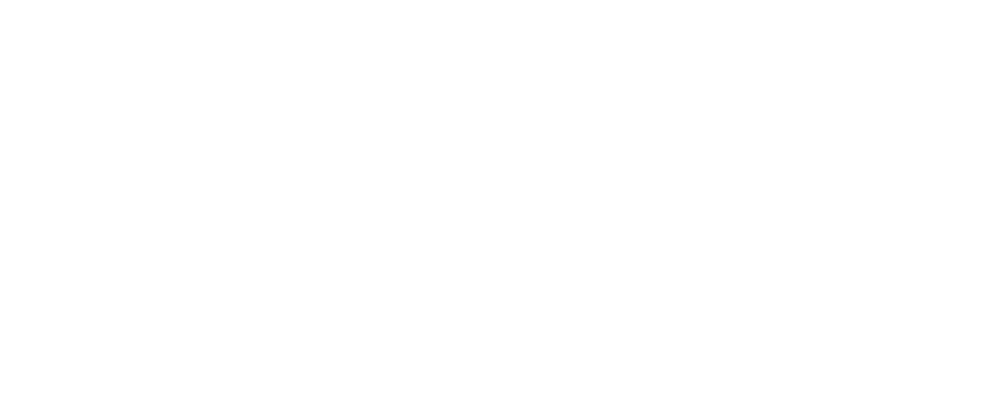

<IPython.core.display.Javascript object>


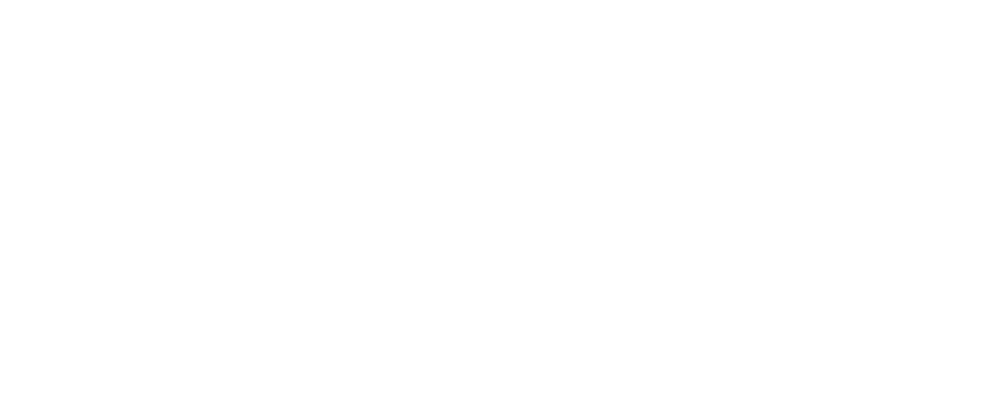

<IPython.core.display.Javascript object>


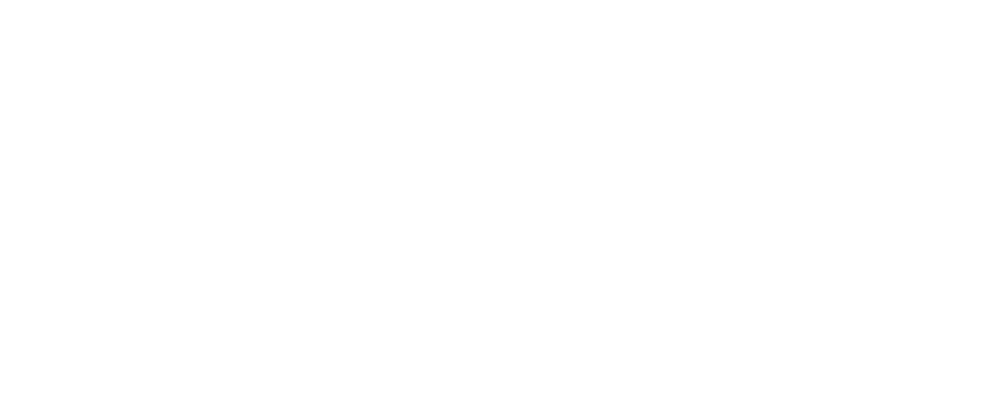

<IPython.core.display.Javascript object>


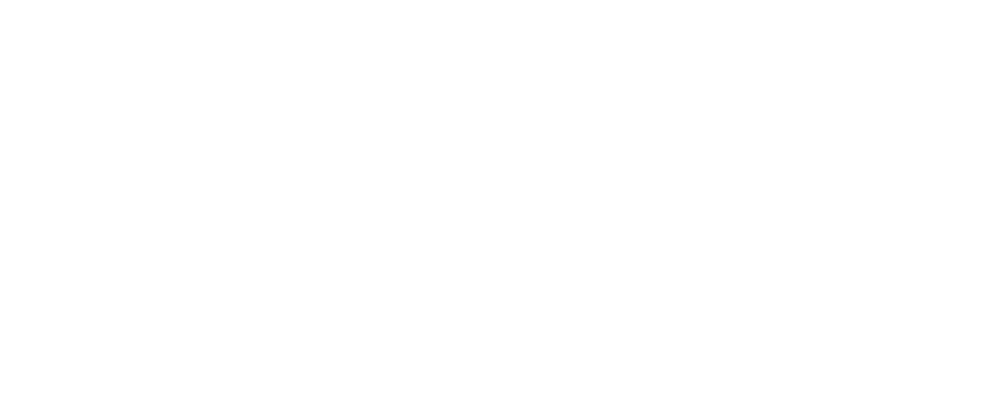

<IPython.core.display.Javascript object>


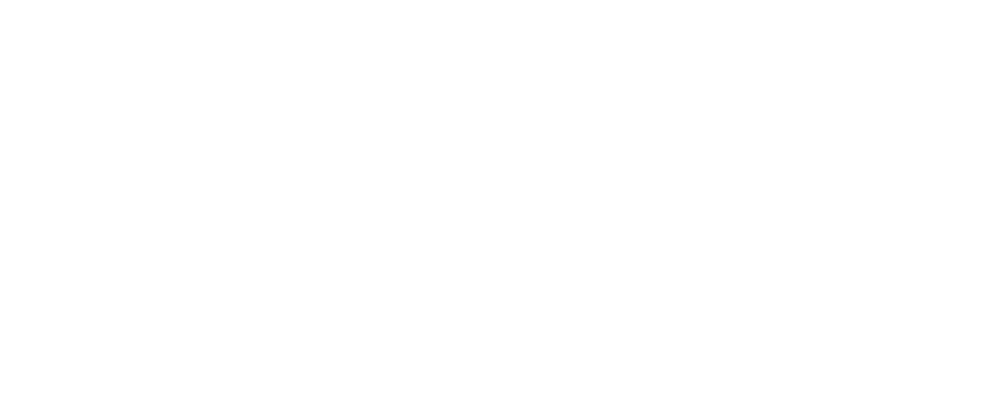

<IPython.core.display.Javascript object>


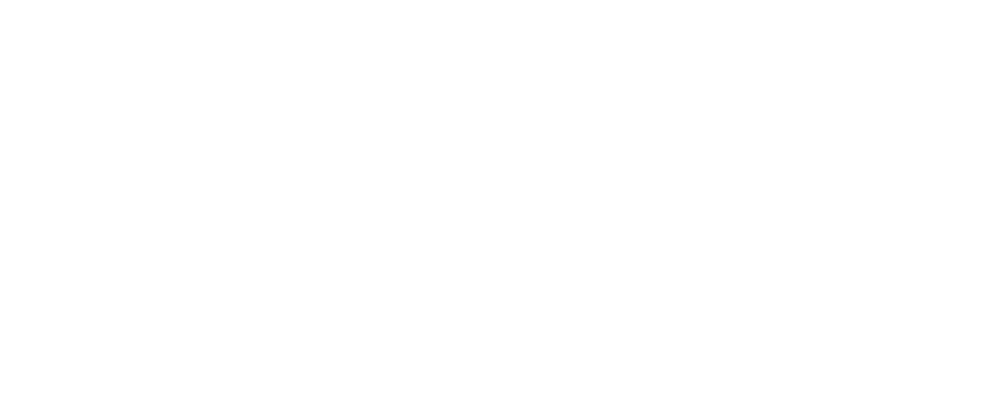

<IPython.core.display.Javascript object>


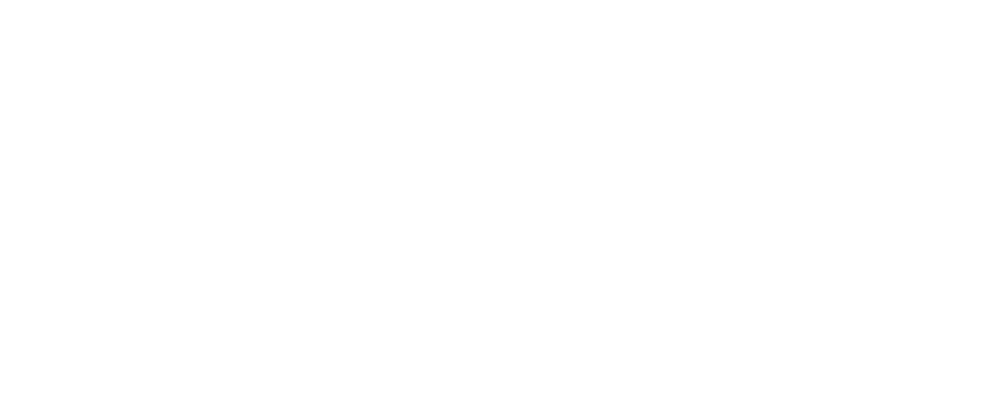

<IPython.core.display.Javascript object>


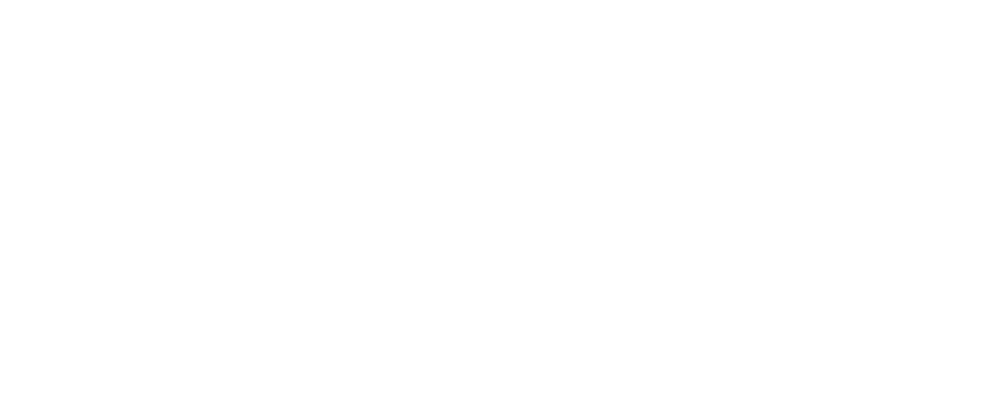

<IPython.core.display.Javascript object>


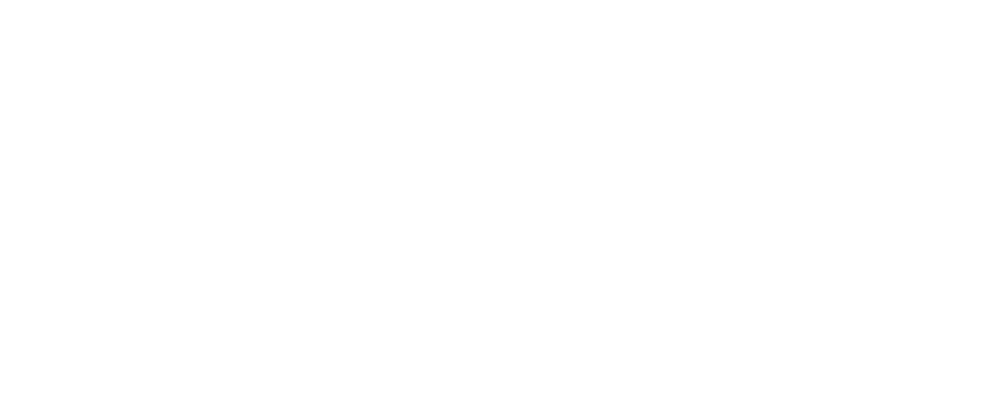

<IPython.core.display.Javascript object>


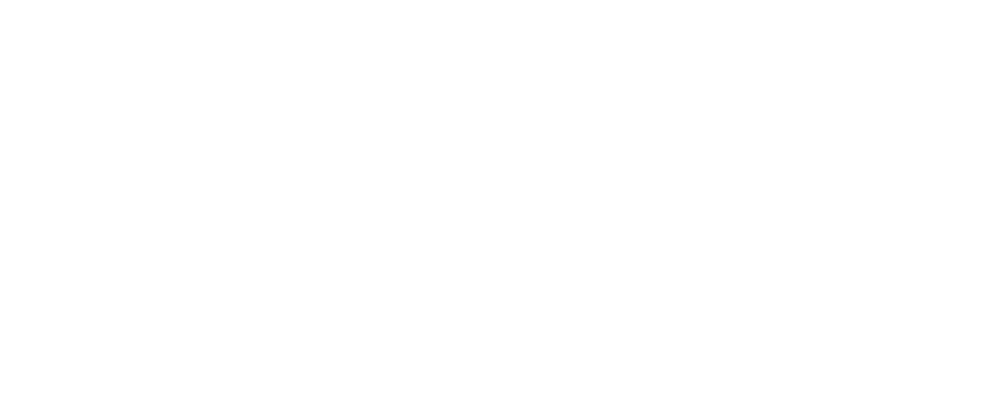

<IPython.core.display.Javascript object>


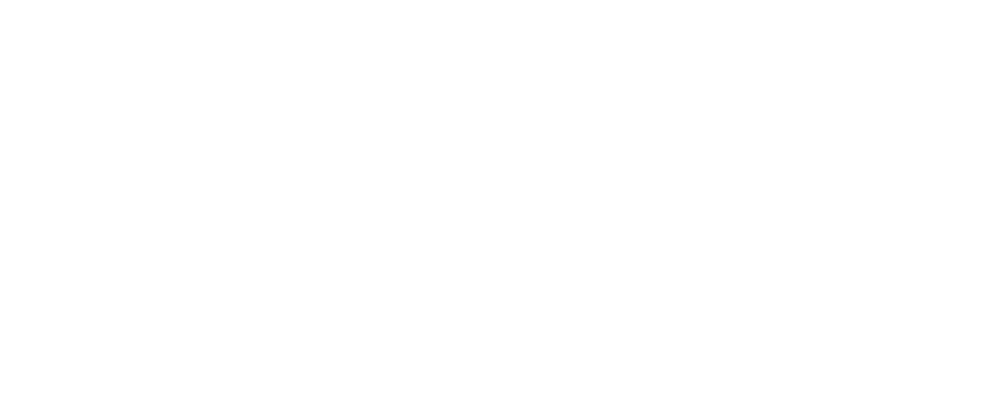

<IPython.core.display.Javascript object>


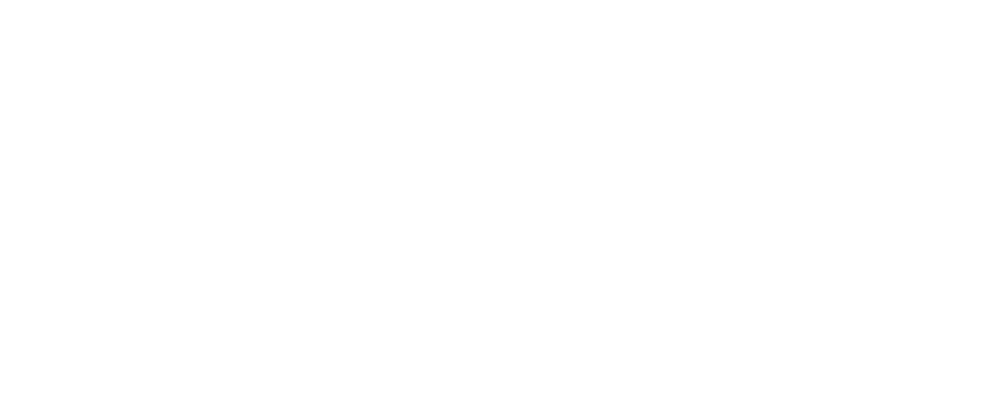

<IPython.core.display.Javascript object>


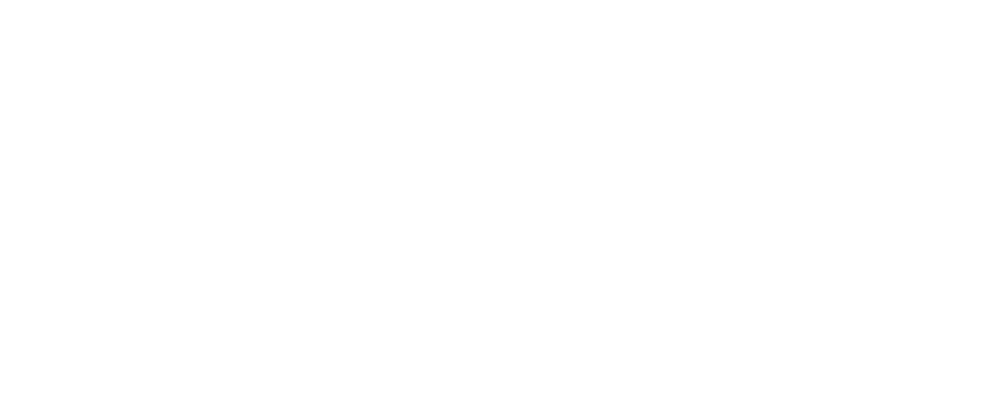

<IPython.core.display.Javascript object>


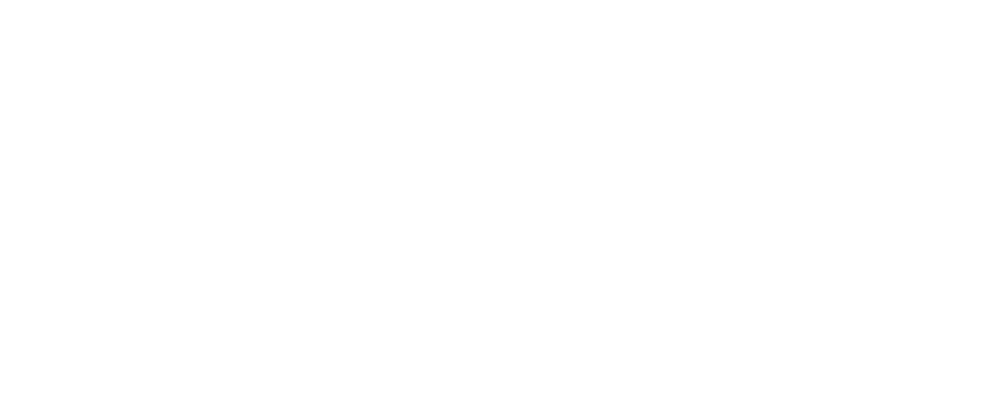

<IPython.core.display.Javascript object>


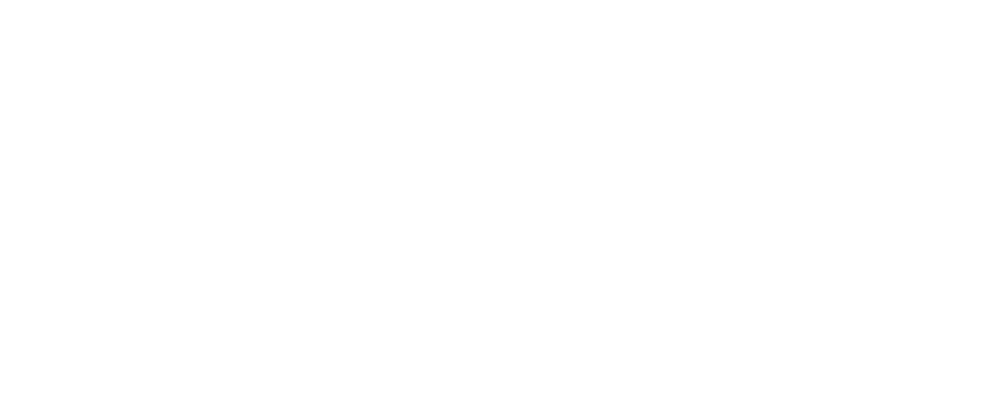

<IPython.core.display.Javascript object>


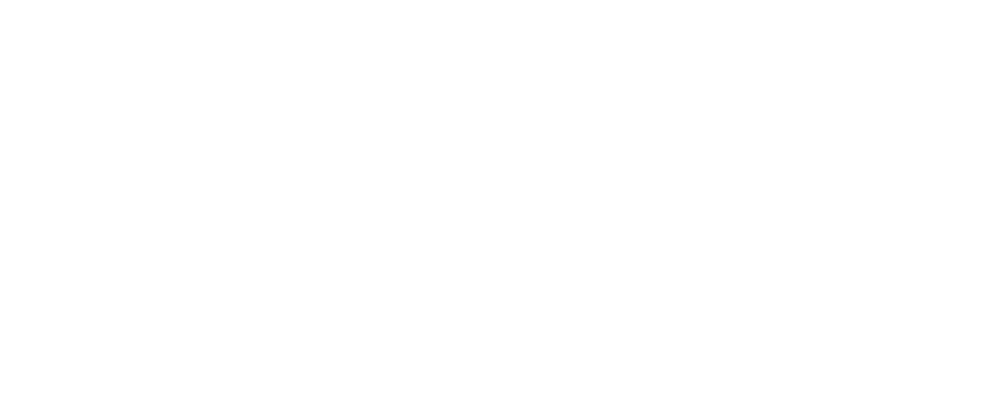

<IPython.core.display.Javascript object>


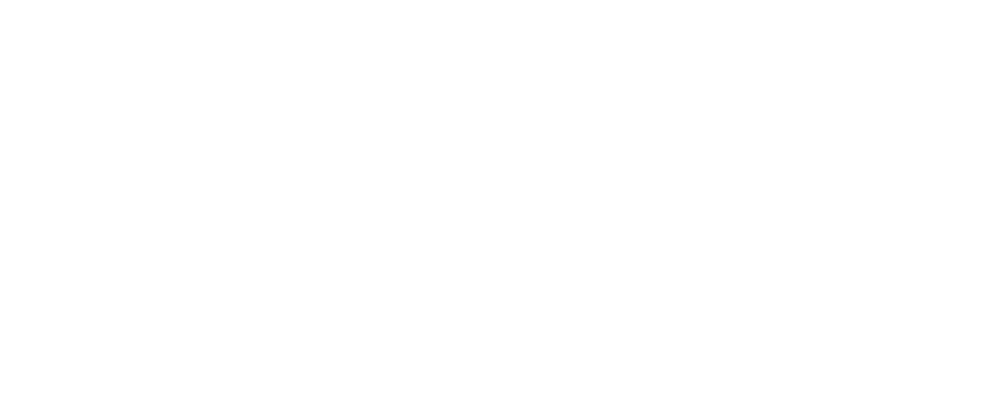

<IPython.core.display.Javascript object>


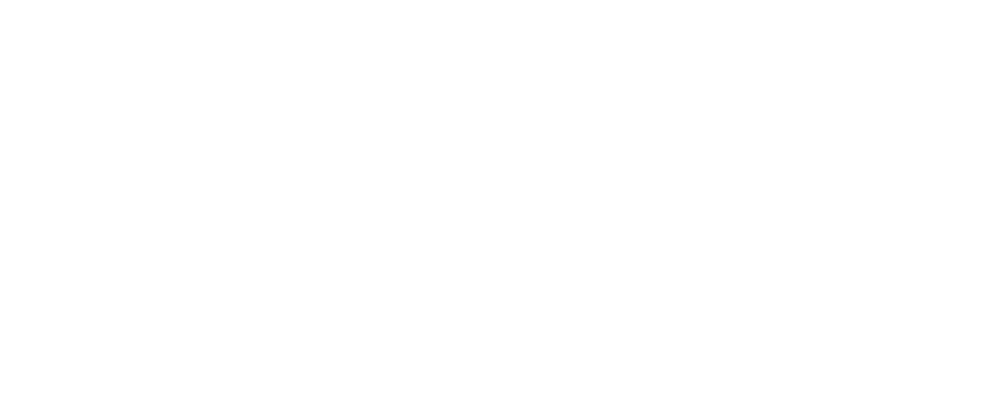

<IPython.core.display.Javascript object>


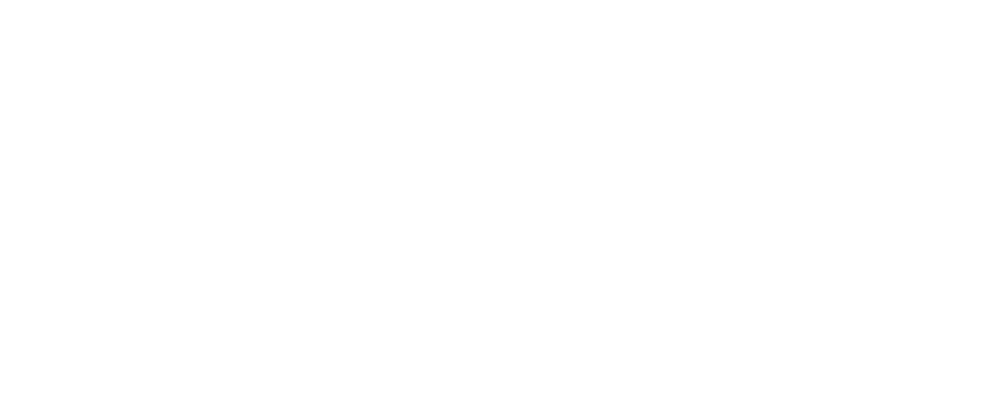

<IPython.core.display.Javascript object>


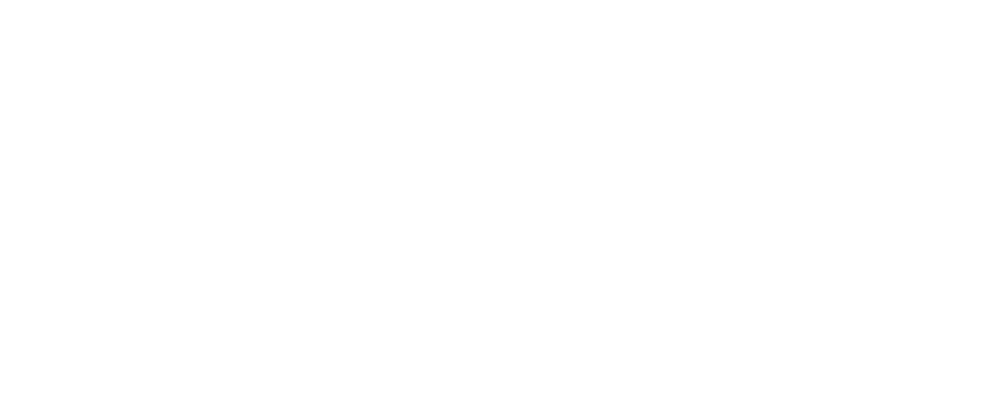

<IPython.core.display.Javascript object>


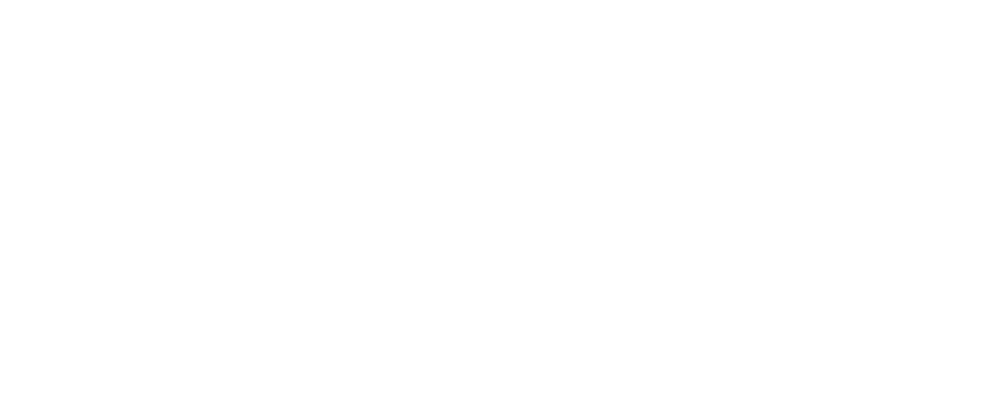

<IPython.core.display.Javascript object>


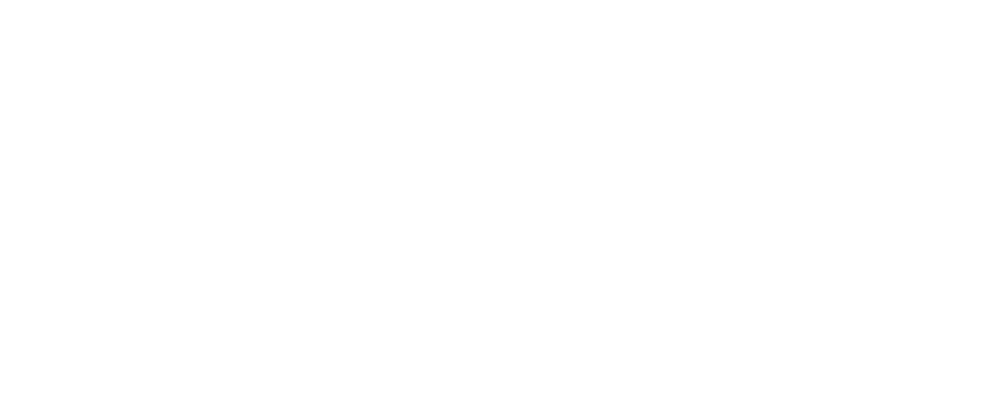

<IPython.core.display.Javascript object>


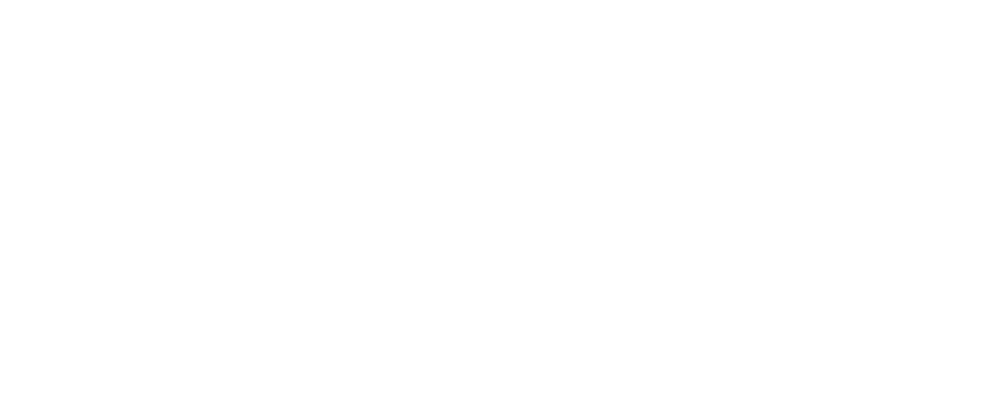

<IPython.core.display.Javascript object>


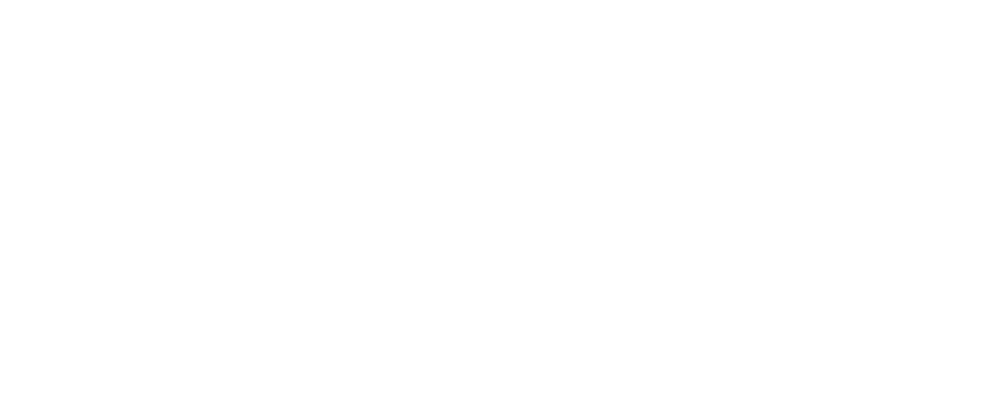

<IPython.core.display.Javascript object>


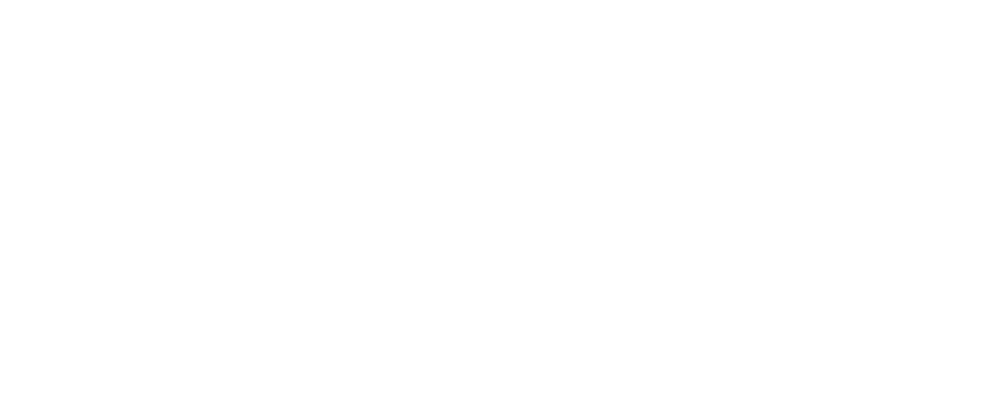

<IPython.core.display.Javascript object>


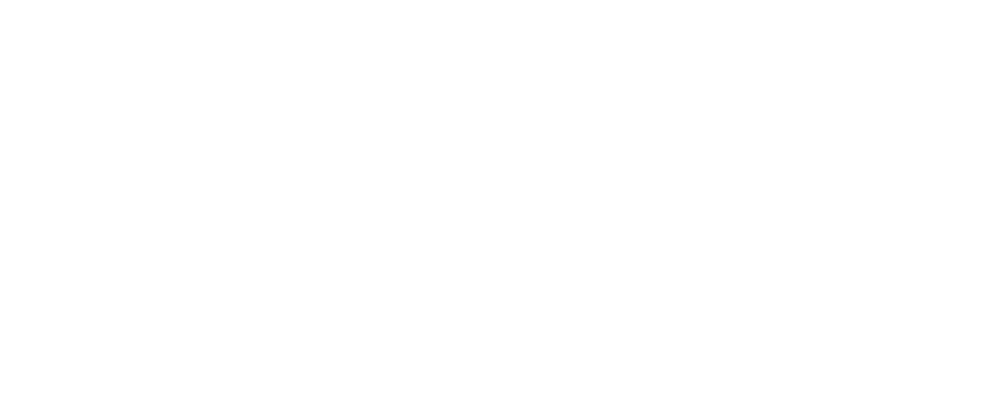

<IPython.core.display.Javascript object>


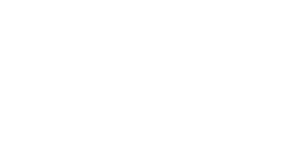

<IPython.core.display.Javascript object>


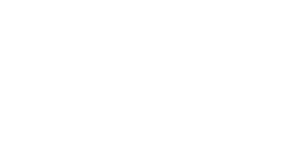

<IPython.core.display.Javascript object>


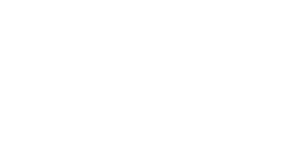

<IPython.core.display.Javascript object>


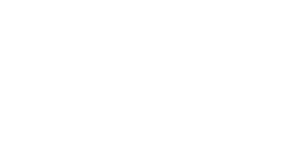

<IPython.core.display.Javascript object>


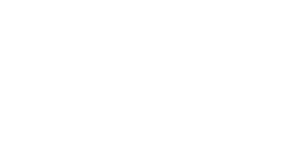

<IPython.core.display.Javascript object>


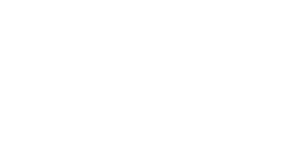

<IPython.core.display.Javascript object>


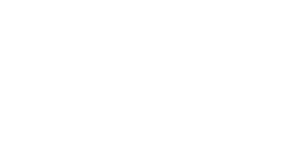

<IPython.core.display.Javascript object>


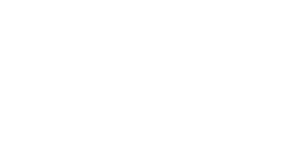

<IPython.core.display.Javascript object>


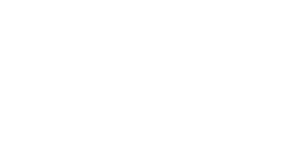

<IPython.core.display.Javascript object>


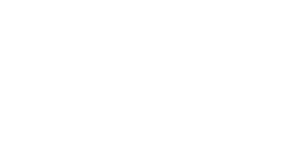

<IPython.core.display.Javascript object>


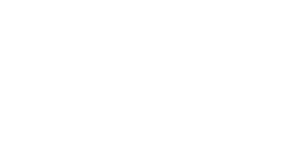

<IPython.core.display.Javascript object>


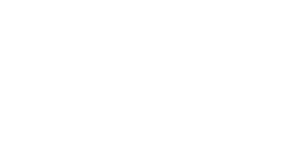

<IPython.core.display.Javascript object>


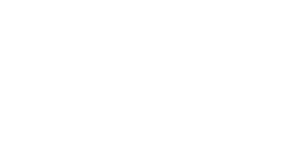

<IPython.core.display.Javascript object>


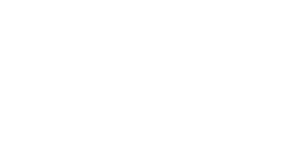

<IPython.core.display.Javascript object>


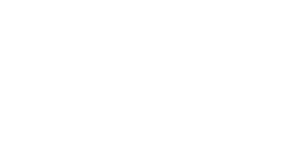

<IPython.core.display.Javascript object>


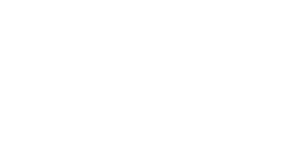

<IPython.core.display.Javascript object>


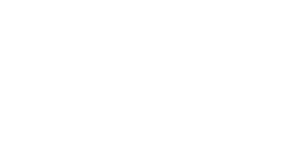

<IPython.core.display.Javascript object>


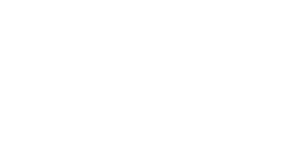

<IPython.core.display.Javascript object>


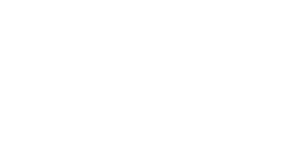

<IPython.core.display.Javascript object>


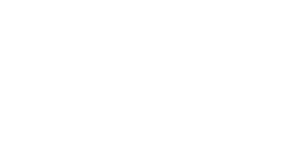

<IPython.core.display.Javascript object>


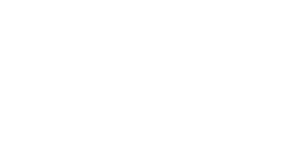

<IPython.core.display.Javascript object>


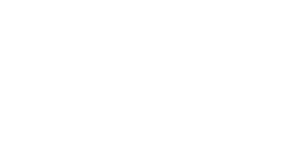

<IPython.core.display.Javascript object>


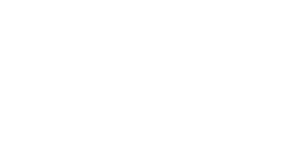

<IPython.core.display.Javascript object>


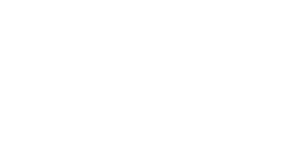

<IPython.core.display.Javascript object>


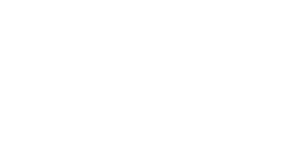

<IPython.core.display.Javascript object>


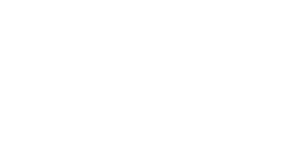

<IPython.core.display.Javascript object>


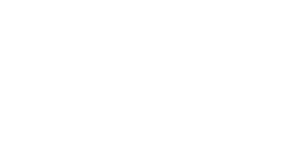

<IPython.core.display.Javascript object>


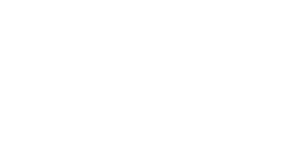

<IPython.core.display.Javascript object>


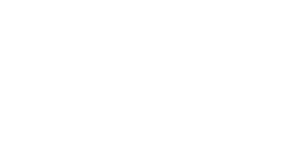

<IPython.core.display.Javascript object>


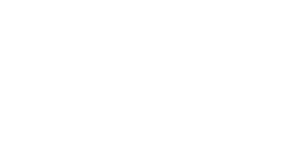

<IPython.core.display.Javascript object>


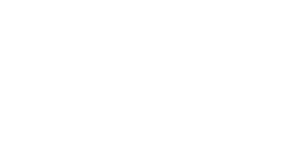

<IPython.core.display.Javascript object>


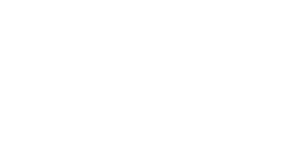

<IPython.core.display.Javascript object>


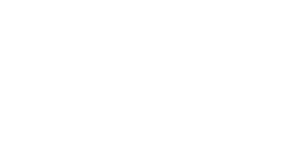

<IPython.core.display.Javascript object>


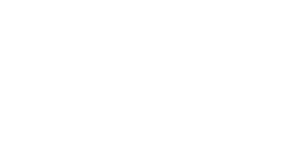

<IPython.core.display.Javascript object>


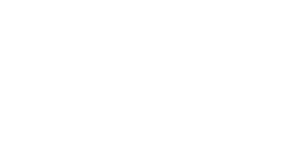

<IPython.core.display.Javascript object>


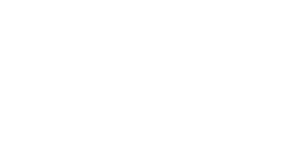

<IPython.core.display.Javascript object>


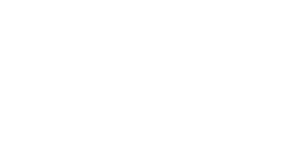

<IPython.core.display.Javascript object>


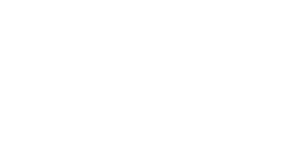

<IPython.core.display.Javascript object>


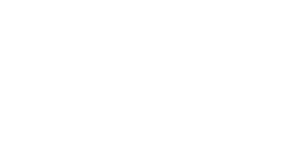

<IPython.core.display.Javascript object>


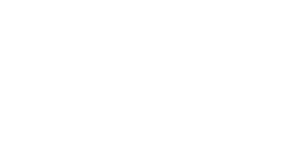

<IPython.core.display.Javascript object>


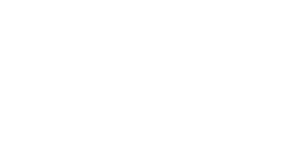

<IPython.core.display.Javascript object>


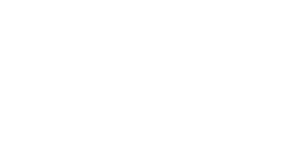

<IPython.core.display.Javascript object>


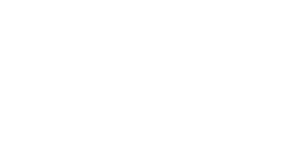

<IPython.core.display.Javascript object>


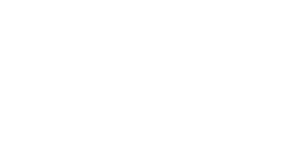

<IPython.core.display.Javascript object>


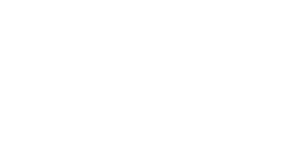

<IPython.core.display.Javascript object>


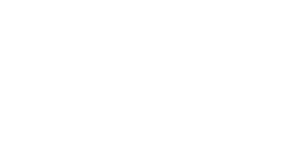

<IPython.core.display.Javascript object>


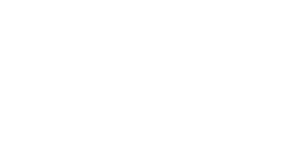

<IPython.core.display.Javascript object>


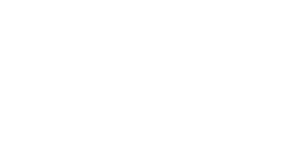

<IPython.core.display.Javascript object>


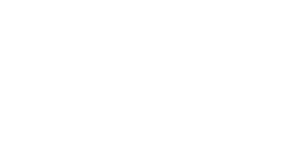

<IPython.core.display.Javascript object>


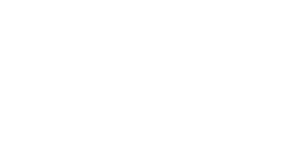

<IPython.core.display.Javascript object>


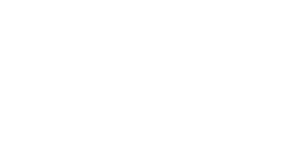

<IPython.core.display.Javascript object>


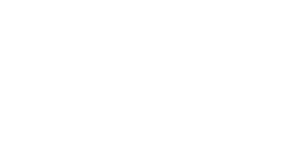

<IPython.core.display.Javascript object>


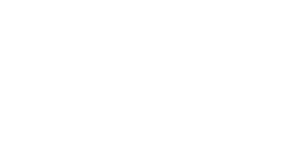

<IPython.core.display.Javascript object>


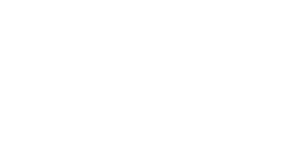

<IPython.core.display.Javascript object>


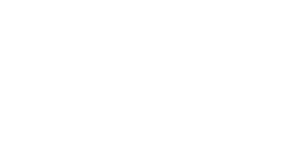

<IPython.core.display.Javascript object>


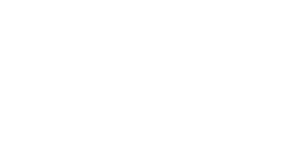

<IPython.core.display.Javascript object>


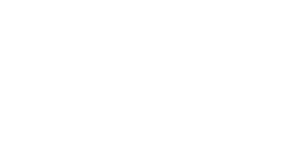

<IPython.core.display.Javascript object>


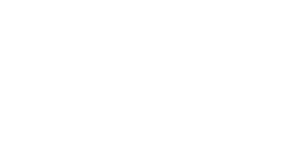

<IPython.core.display.Javascript object>


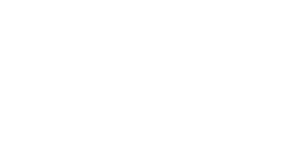

<IPython.core.display.Javascript object>


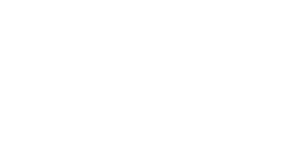

<IPython.core.display.Javascript object>


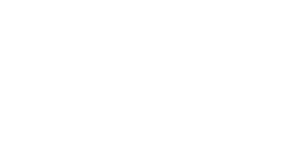

<IPython.core.display.Javascript object>


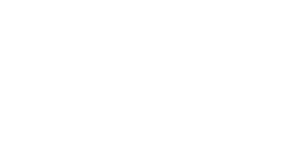

<IPython.core.display.Javascript object>


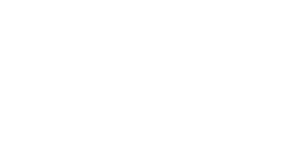

<IPython.core.display.Javascript object>


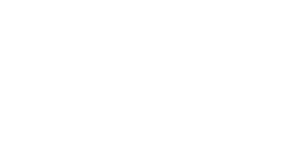

<IPython.core.display.Javascript object>


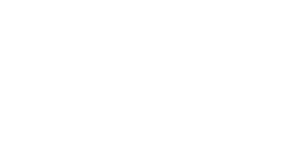

<IPython.core.display.Javascript object>


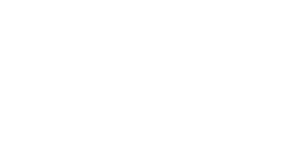

<IPython.core.display.Javascript object>


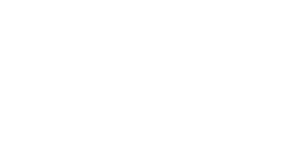

<IPython.core.display.Javascript object>


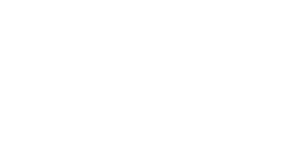

<IPython.core.display.Javascript object>


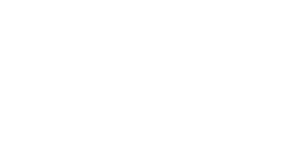

<IPython.core.display.Javascript object>


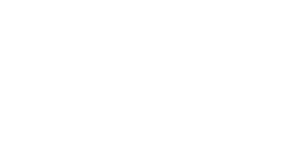

<IPython.core.display.Javascript object>


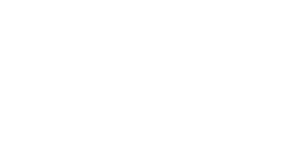

<IPython.core.display.Javascript object>


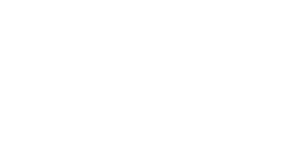

<IPython.core.display.Javascript object>


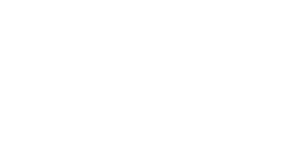

<IPython.core.display.Javascript object>


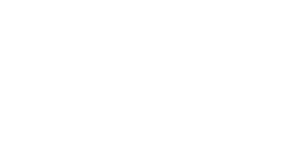

<IPython.core.display.Javascript object>


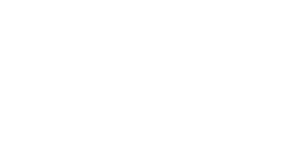

<IPython.core.display.Javascript object>


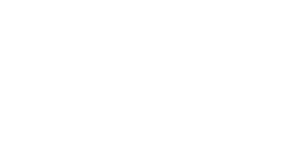

<IPython.core.display.Javascript object>


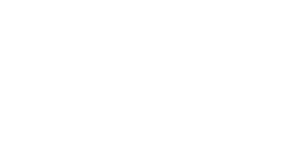

<IPython.core.display.Javascript object>


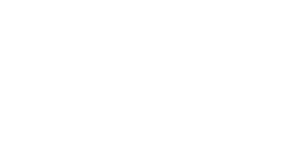

<IPython.core.display.Javascript object>


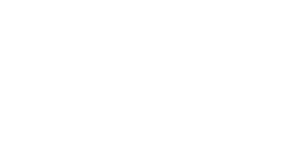

<IPython.core.display.Javascript object>


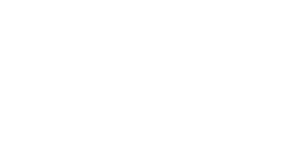

<IPython.core.display.Javascript object>


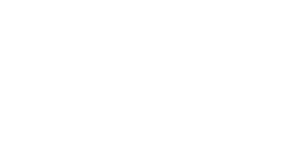

<IPython.core.display.Javascript object>


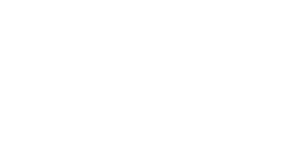

<IPython.core.display.Javascript object>


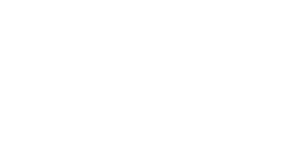

<IPython.core.display.Javascript object>


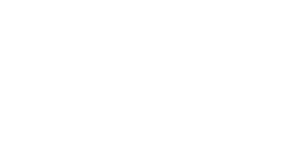

<IPython.core.display.Javascript object>


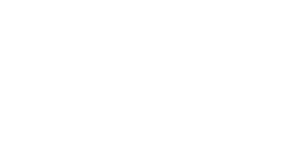

<IPython.core.display.Javascript object>


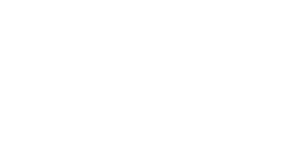

<IPython.core.display.Javascript object>


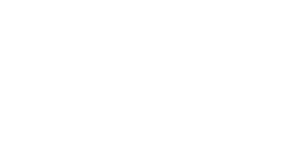

<IPython.core.display.Javascript object>


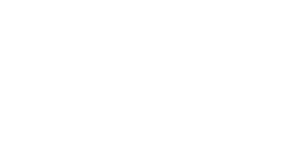

<IPython.core.display.Javascript object>


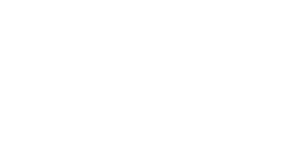

<IPython.core.display.Javascript object>


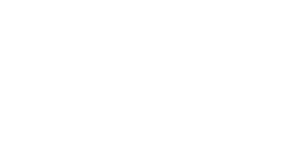

<IPython.core.display.Javascript object>


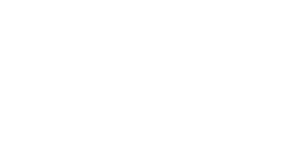

<IPython.core.display.Javascript object>


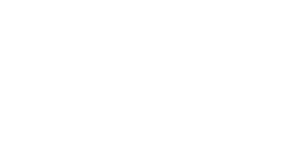

<IPython.core.display.Javascript object>


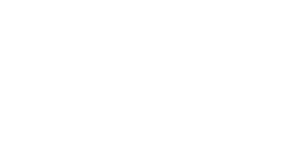

<IPython.core.display.Javascript object>


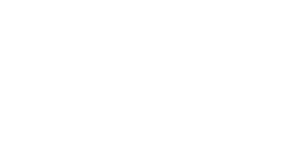

<IPython.core.display.Javascript object>


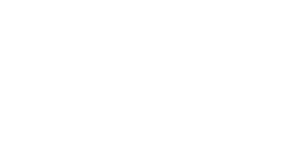

<IPython.core.display.Javascript object>


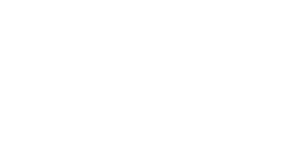

<IPython.core.display.Javascript object>


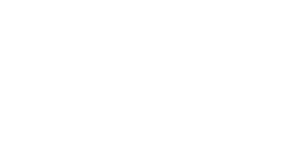

<IPython.core.display.Javascript object>


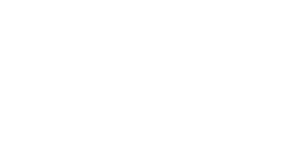

<IPython.core.display.Javascript object>


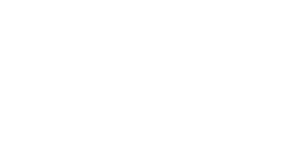

<IPython.core.display.Javascript object>


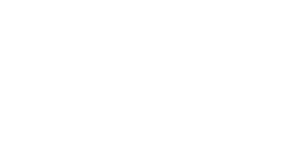

<IPython.core.display.Javascript object>


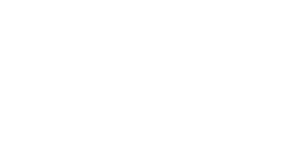

<IPython.core.display.Javascript object>


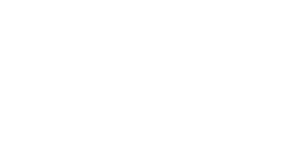

<IPython.core.display.Javascript object>


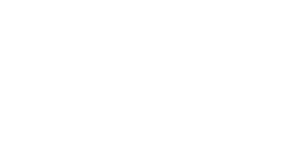

<IPython.core.display.Javascript object>


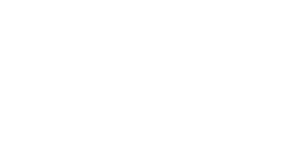

<IPython.core.display.Javascript object>


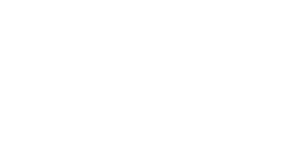

<IPython.core.display.Javascript object>


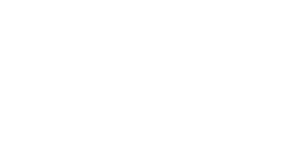

<IPython.core.display.Javascript object>


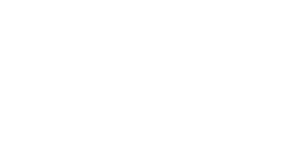

<IPython.core.display.Javascript object>


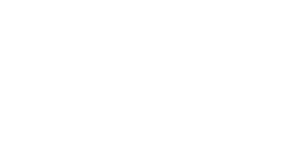

<IPython.core.display.Javascript object>


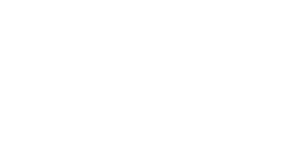

<IPython.core.display.Javascript object>


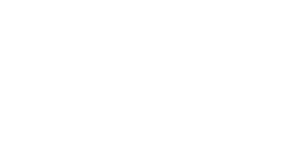

<IPython.core.display.Javascript object>


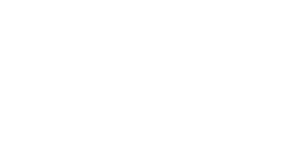

<IPython.core.display.Javascript object>


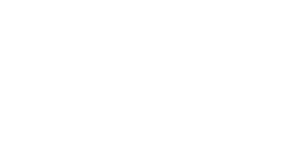

<IPython.core.display.Javascript object>


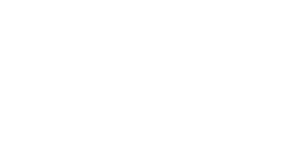

<IPython.core.display.Javascript object>


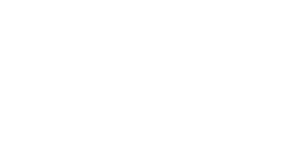

<IPython.core.display.Javascript object>


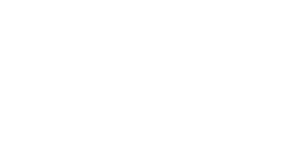

<IPython.core.display.Javascript object>


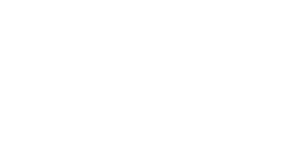

<IPython.core.display.Javascript object>


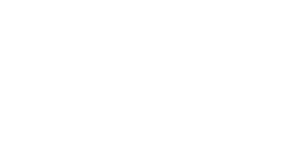

<IPython.core.display.Javascript object>


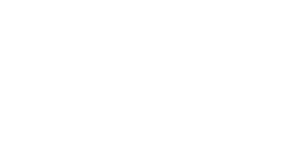

<IPython.core.display.Javascript object>


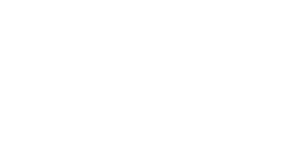

<IPython.core.display.Javascript object>


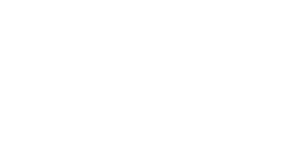

<IPython.core.display.Javascript object>


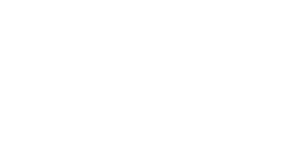

<IPython.core.display.Javascript object>


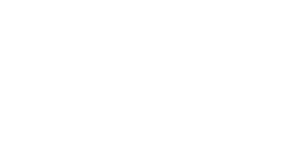

<IPython.core.display.Javascript object>


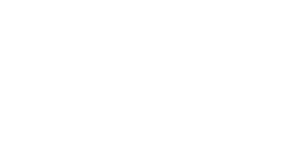

<IPython.core.display.Javascript object>


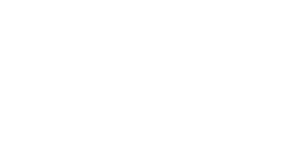

<IPython.core.display.Javascript object>


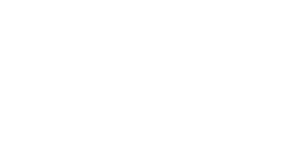

<IPython.core.display.Javascript object>


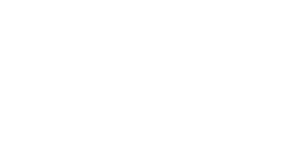

<IPython.core.display.Javascript object>


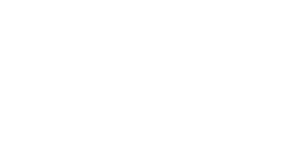

<IPython.core.display.Javascript object>


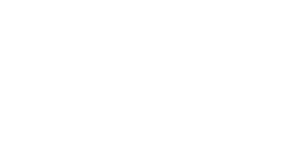

<IPython.core.display.Javascript object>


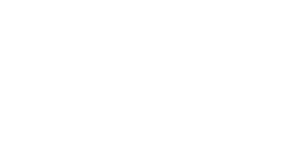

<IPython.core.display.Javascript object>


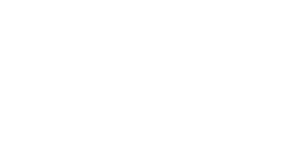

<IPython.core.display.Javascript object>


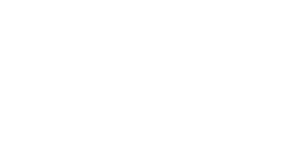

<IPython.core.display.Javascript object>


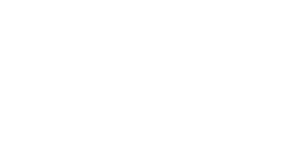

<IPython.core.display.Javascript object>


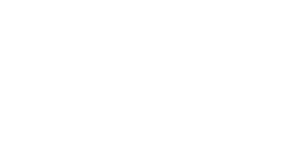

<IPython.core.display.Javascript object>


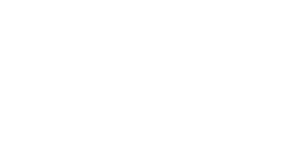

<IPython.core.display.Javascript object>


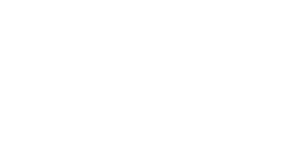

<IPython.core.display.Javascript object>


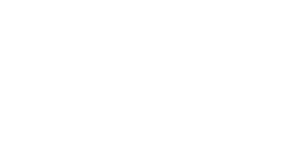

<IPython.core.display.Javascript object>


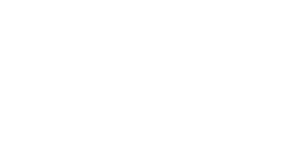

<IPython.core.display.Javascript object>


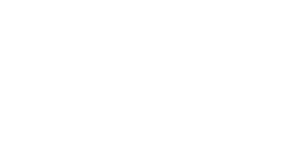

<IPython.core.display.Javascript object>


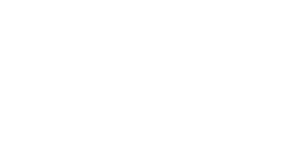

<IPython.core.display.Javascript object>


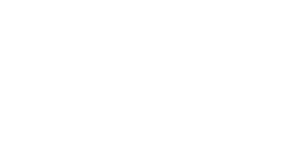

<IPython.core.display.Javascript object>


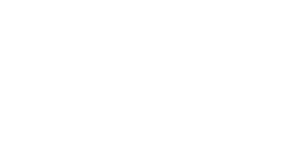

<IPython.core.display.Javascript object>


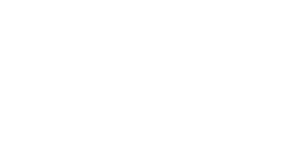

<IPython.core.display.Javascript object>


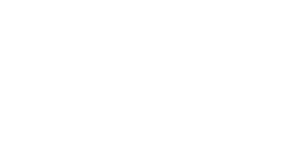

<IPython.core.display.Javascript object>


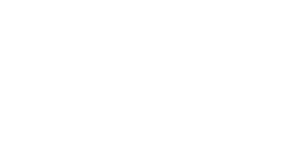

<IPython.core.display.Javascript object>


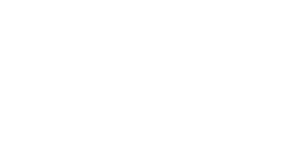

<IPython.core.display.Javascript object>


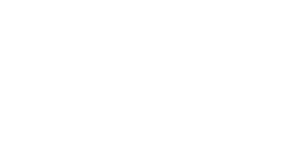

<IPython.core.display.Javascript object>


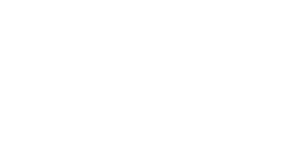

<IPython.core.display.Javascript object>


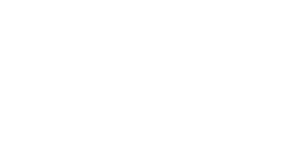

<IPython.core.display.Javascript object>


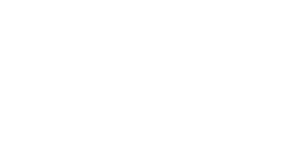

<IPython.core.display.Javascript object>


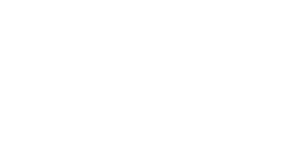

<IPython.core.display.Javascript object>


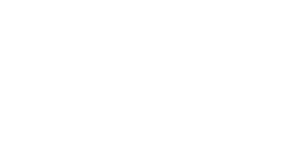

<IPython.core.display.Javascript object>


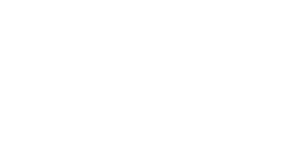

<IPython.core.display.Javascript object>


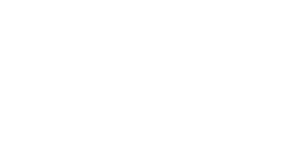

<IPython.core.display.Javascript object>


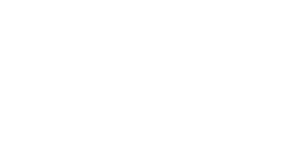

<IPython.core.display.Javascript object>


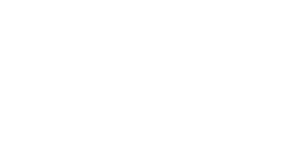

<IPython.core.display.Javascript object>


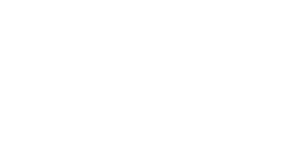

<IPython.core.display.Javascript object>


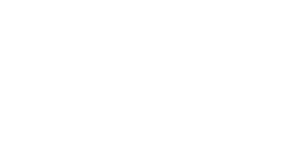

<IPython.core.display.Javascript object>


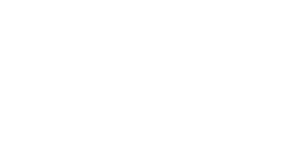

<IPython.core.display.Javascript object>


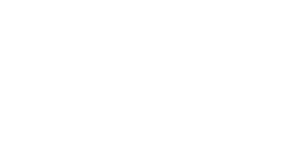

<IPython.core.display.Javascript object>


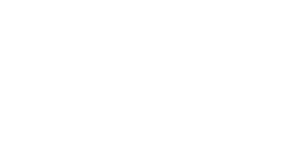

<IPython.core.display.Javascript object>


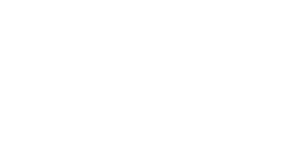

<IPython.core.display.Javascript object>


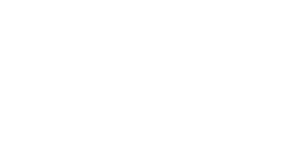

<IPython.core.display.Javascript object>


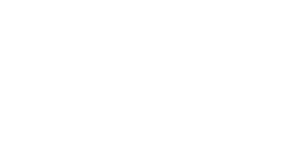

<IPython.core.display.Javascript object>


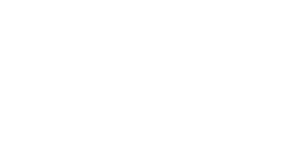

<IPython.core.display.Javascript object>


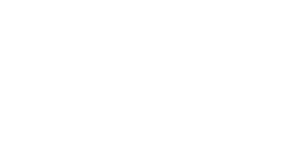

<IPython.core.display.Javascript object>


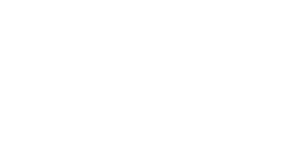

<IPython.core.display.Javascript object>


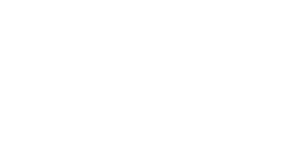

<IPython.core.display.Javascript object>


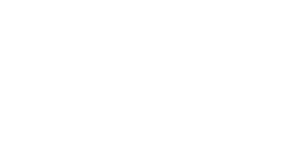

<IPython.core.display.Javascript object>


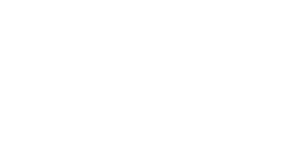

<IPython.core.display.Javascript object>


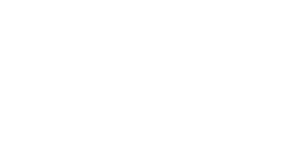

<IPython.core.display.Javascript object>


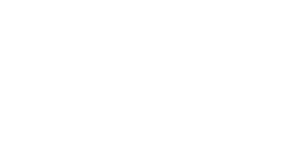

<IPython.core.display.Javascript object>


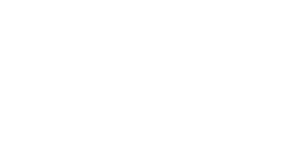

<IPython.core.display.Javascript object>


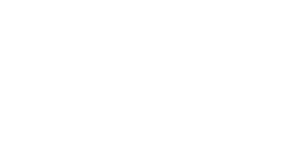

<IPython.core.display.Javascript object>


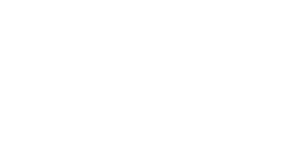

<IPython.core.display.Javascript object>


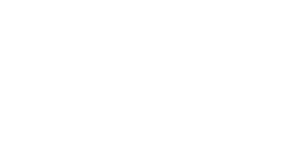

<IPython.core.display.Javascript object>


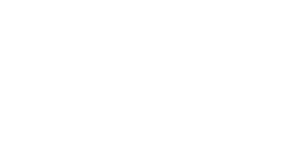

<IPython.core.display.Javascript object>


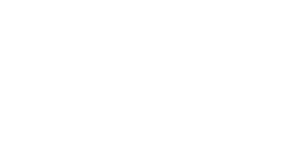

<IPython.core.display.Javascript object>


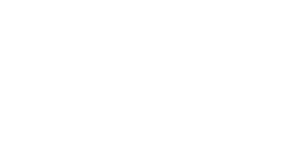

<IPython.core.display.Javascript object>


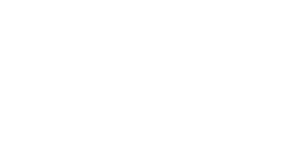

<IPython.core.display.Javascript object>


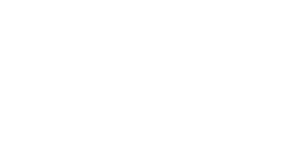

<IPython.core.display.Javascript object>


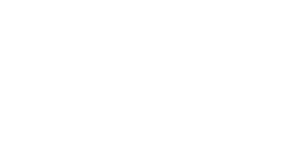

<IPython.core.display.Javascript object>


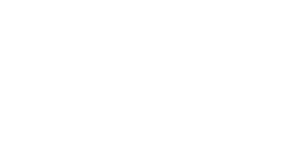

<IPython.core.display.Javascript object>


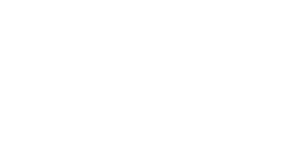

<IPython.core.display.Javascript object>


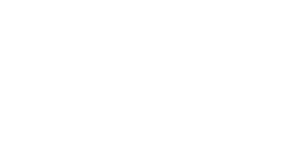

<IPython.core.display.Javascript object>


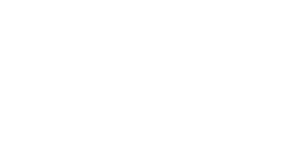

<IPython.core.display.Javascript object>


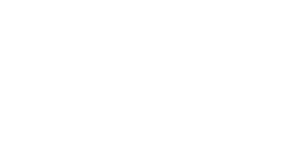

<IPython.core.display.Javascript object>


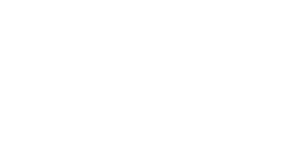

<IPython.core.display.Javascript object>


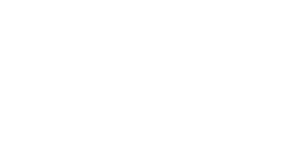

<IPython.core.display.Javascript object>


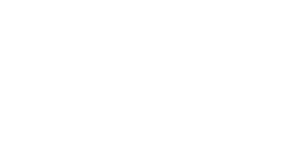

<IPython.core.display.Javascript object>


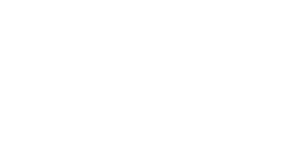

<IPython.core.display.Javascript object>


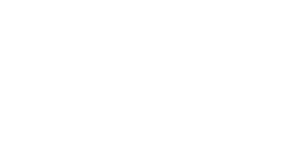

<IPython.core.display.Javascript object>


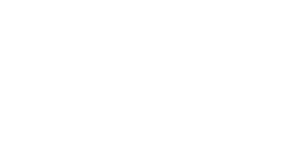

<IPython.core.display.Javascript object>


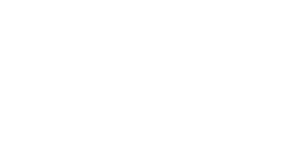

<IPython.core.display.Javascript object>


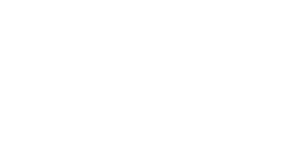

<IPython.core.display.Javascript object>


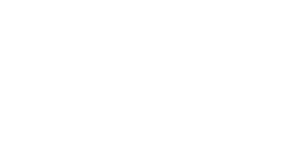

<IPython.core.display.Javascript object>


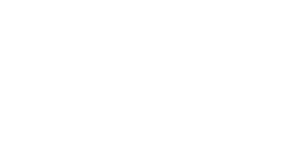

<IPython.core.display.Javascript object>


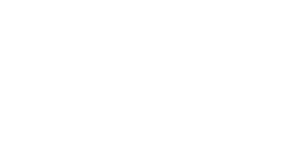

<IPython.core.display.Javascript object>


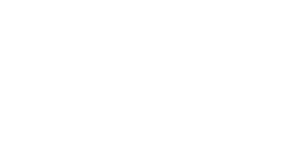

<IPython.core.display.Javascript object>


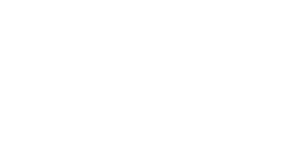

<IPython.core.display.Javascript object>


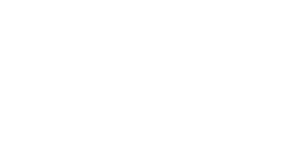

<IPython.core.display.Javascript object>


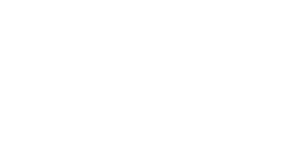

<IPython.core.display.Javascript object>


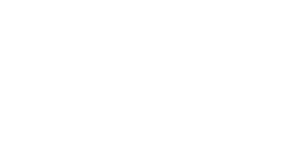

<IPython.core.display.Javascript object>


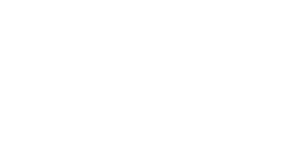

<IPython.core.display.Javascript object>


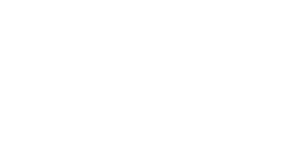

<IPython.core.display.Javascript object>


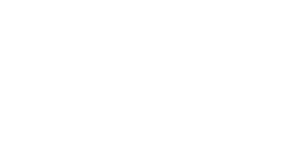

<IPython.core.display.Javascript object>


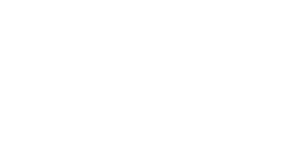

<IPython.core.display.Javascript object>


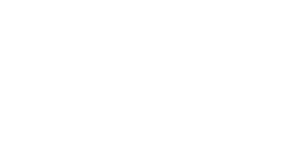

<IPython.core.display.Javascript object>


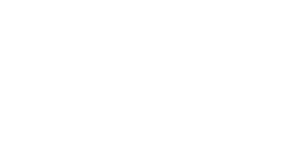

<IPython.core.display.Javascript object>


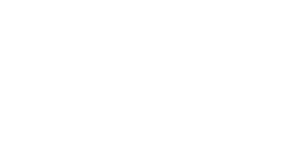

<IPython.core.display.Javascript object>


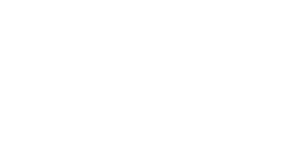

<IPython.core.display.Javascript object>


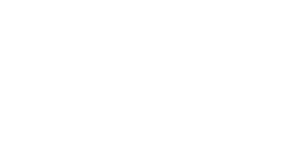

<IPython.core.display.Javascript object>


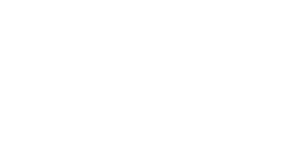

<IPython.core.display.Javascript object>


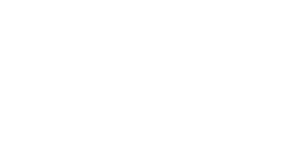

<IPython.core.display.Javascript object>


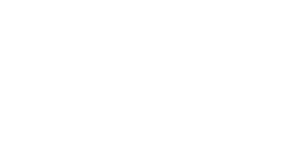

<IPython.core.display.Javascript object>


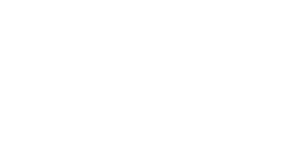

<IPython.core.display.Javascript object>


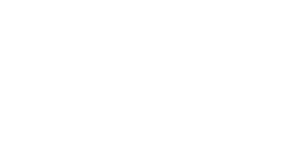

<IPython.core.display.Javascript object>


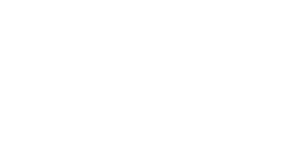

<IPython.core.display.Javascript object>


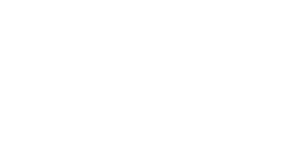

<IPython.core.display.Javascript object>


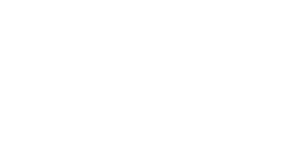

<IPython.core.display.Javascript object>


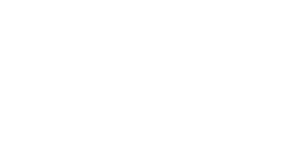

<IPython.core.display.Javascript object>


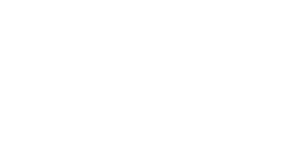

<IPython.core.display.Javascript object>


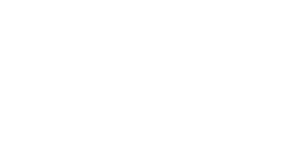

<IPython.core.display.Javascript object>


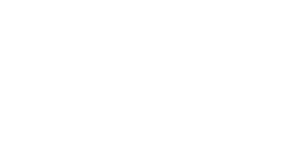

<IPython.core.display.Javascript object>


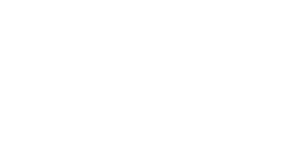

<IPython.core.display.Javascript object>


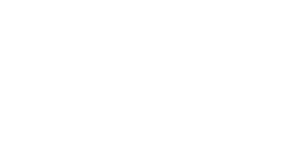

<IPython.core.display.Javascript object>


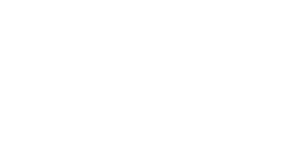

<IPython.core.display.Javascript object>


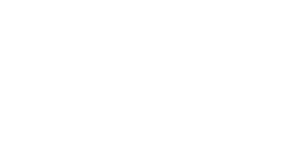

<IPython.core.display.Javascript object>


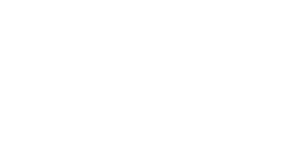

<IPython.core.display.Javascript object>


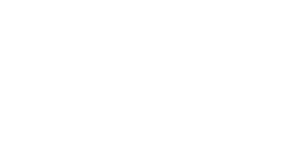

<IPython.core.display.Javascript object>


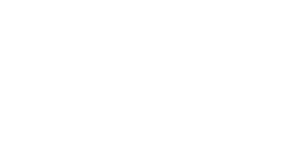

<IPython.core.display.Javascript object>


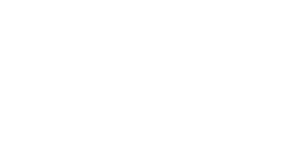

<IPython.core.display.Javascript object>


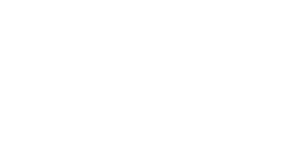

<IPython.core.display.Javascript object>


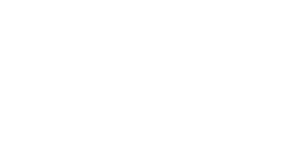

<IPython.core.display.Javascript object>


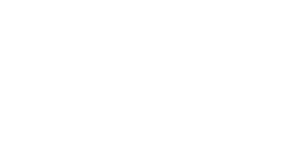

<IPython.core.display.Javascript object>


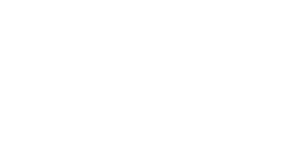

<IPython.core.display.Javascript object>


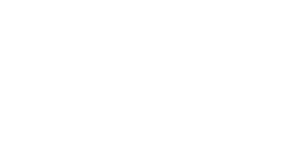

<IPython.core.display.Javascript object>


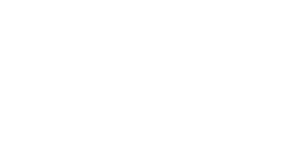

<IPython.core.display.Javascript object>


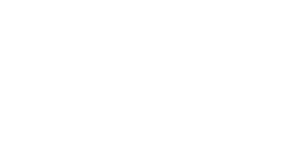

<IPython.core.display.Javascript object>


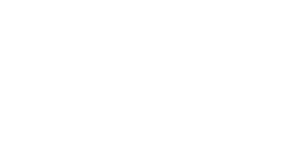

<IPython.core.display.Javascript object>


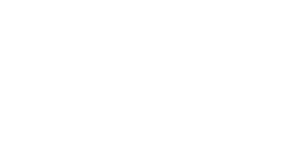

<IPython.core.display.Javascript object>


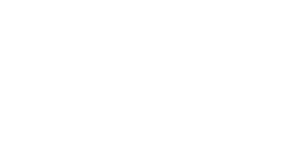

<IPython.core.display.Javascript object>


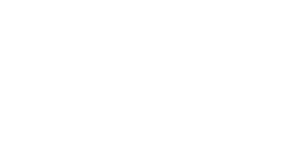

<IPython.core.display.Javascript object>


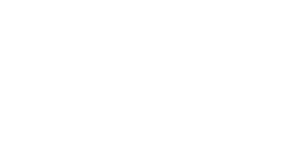

<IPython.core.display.Javascript object>


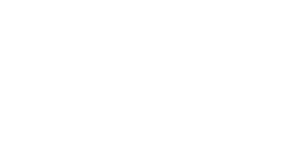

<IPython.core.display.Javascript object>


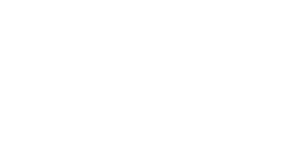

<IPython.core.display.Javascript object>


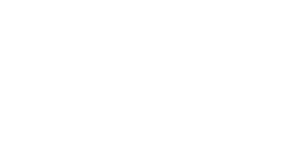

<IPython.core.display.Javascript object>


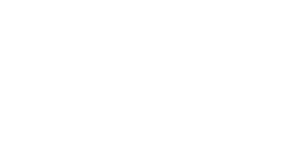

<IPython.core.display.Javascript object>


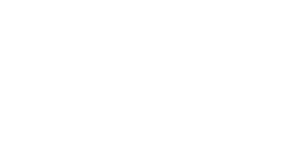

<IPython.core.display.Javascript object>


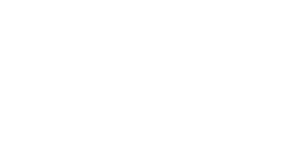

<IPython.core.display.Javascript object>


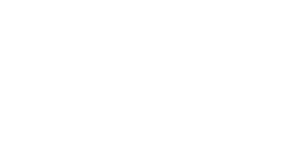

<IPython.core.display.Javascript object>


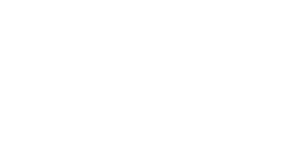

<IPython.core.display.Javascript object>


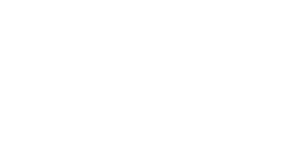

<IPython.core.display.Javascript object>


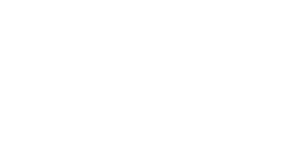

<IPython.core.display.Javascript object>


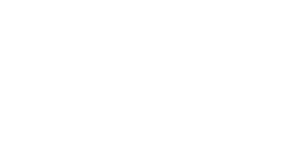

<IPython.core.display.Javascript object>


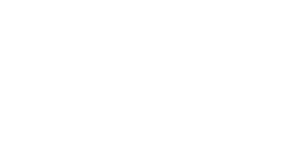

<IPython.core.display.Javascript object>


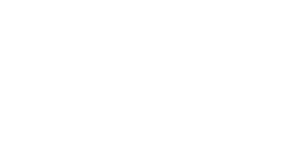

<IPython.core.display.Javascript object>


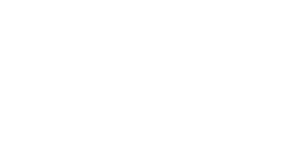

<IPython.core.display.Javascript object>


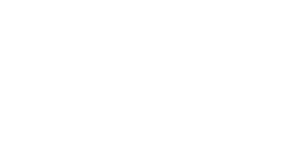

<IPython.core.display.Javascript object>


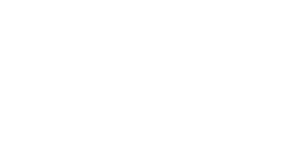

<IPython.core.display.Javascript object>


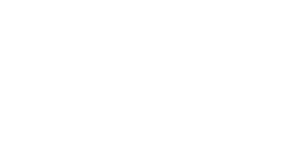

<IPython.core.display.Javascript object>


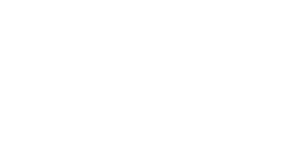

<IPython.core.display.Javascript object>


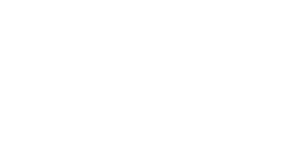

<IPython.core.display.Javascript object>


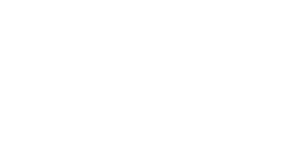

<IPython.core.display.Javascript object>


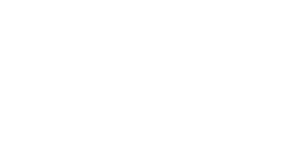

<IPython.core.display.Javascript object>


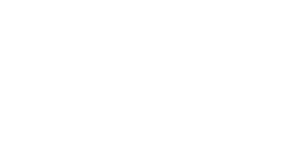

<IPython.core.display.Javascript object>


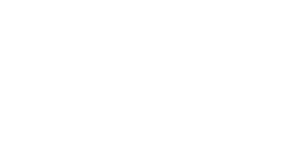

<IPython.core.display.Javascript object>


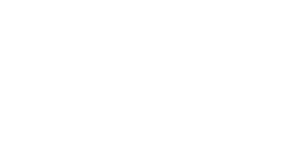

<IPython.core.display.Javascript object>


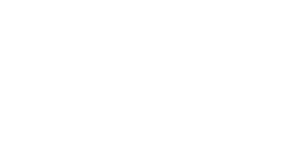

<IPython.core.display.Javascript object>


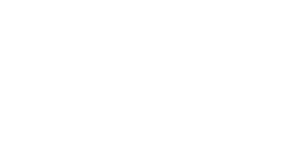

<IPython.core.display.Javascript object>


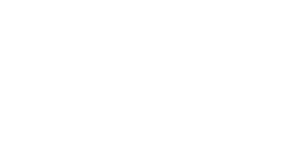

<IPython.core.display.Javascript object>


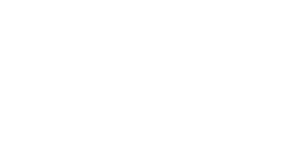

<IPython.core.display.Javascript object>


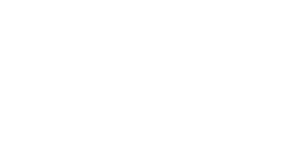

<IPython.core.display.Javascript object>


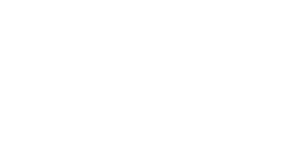

<IPython.core.display.Javascript object>


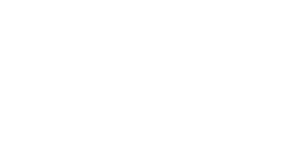

<IPython.core.display.Javascript object>


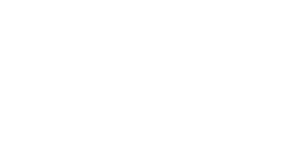

<IPython.core.display.Javascript object>


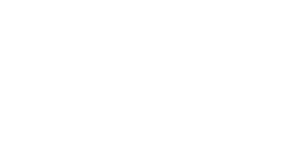

<IPython.core.display.Javascript object>


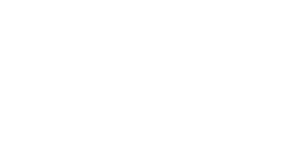

<IPython.core.display.Javascript object>


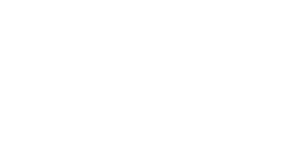

<IPython.core.display.Javascript object>


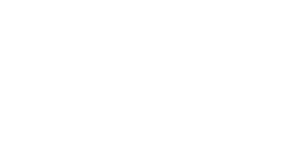

<IPython.core.display.Javascript object>


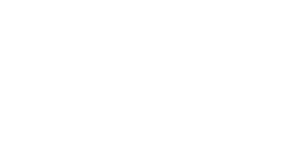

<IPython.core.display.Javascript object>


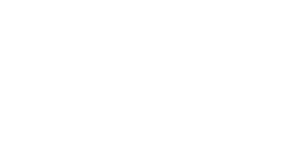

<IPython.core.display.Javascript object>


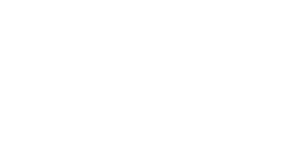

<IPython.core.display.Javascript object>


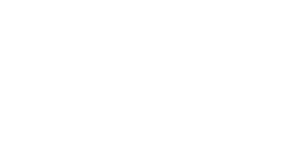

<IPython.core.display.Javascript object>


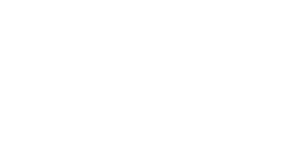

<IPython.core.display.Javascript object>


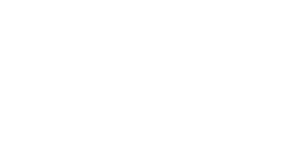

<IPython.core.display.Javascript object>


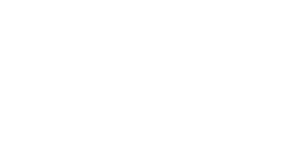

<IPython.core.display.Javascript object>


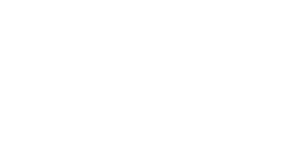

<IPython.core.display.Javascript object>


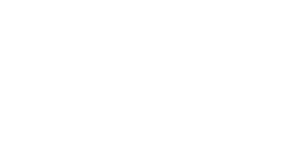

<IPython.core.display.Javascript object>


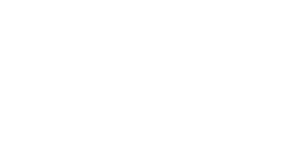

<IPython.core.display.Javascript object>


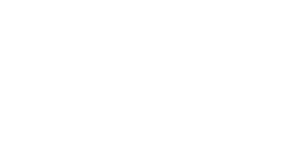

<IPython.core.display.Javascript object>


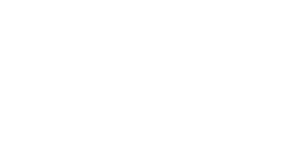

<IPython.core.display.Javascript object>


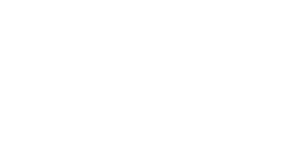

<IPython.core.display.Javascript object>


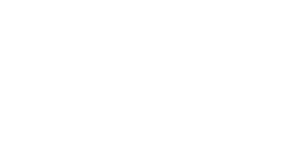

<IPython.core.display.Javascript object>


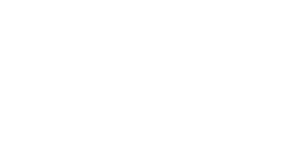

<IPython.core.display.Javascript object>


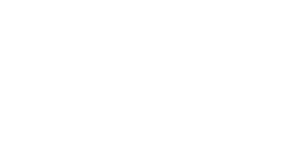

<IPython.core.display.Javascript object>


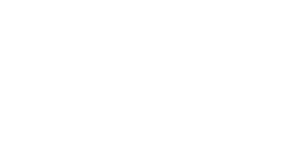

<IPython.core.display.Javascript object>


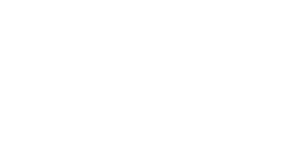

<IPython.core.display.Javascript object>


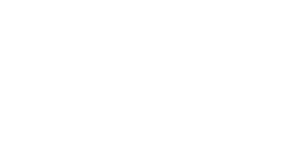

<IPython.core.display.Javascript object>


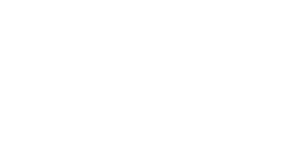

<IPython.core.display.Javascript object>


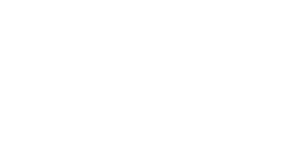

<IPython.core.display.Javascript object>


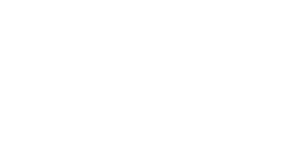

<IPython.core.display.Javascript object>


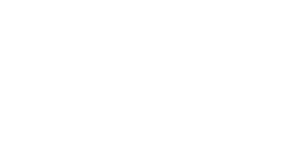

<IPython.core.display.Javascript object>


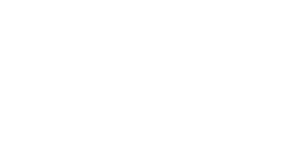

<IPython.core.display.Javascript object>


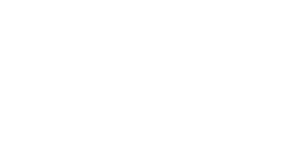

<IPython.core.display.Javascript object>


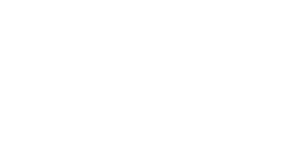

<IPython.core.display.Javascript object>


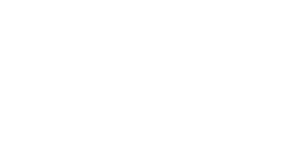

<IPython.core.display.Javascript object>


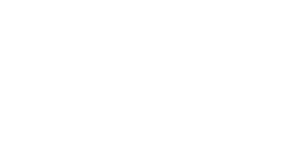

<IPython.core.display.Javascript object>


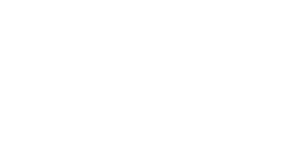

<IPython.core.display.Javascript object>


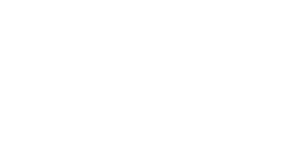

In [23]:
plotLines(spath, linelist, savePath, window=5, plt_guidelines=True, plotRef = True, ftype='bin')